# 🎯The Goal

   - Each row in the dataset describes the characteristics of a house.
   - Our goal is to predict the SalePrice, given these features.
   - Our models are evaluated on the Root-Mean-Squared-Error (RMSE) between the log of the SalePrice predicted by our model, and the log of the actual SalePrice. Converting RMSE errors to a log scale ensures that errors in predicting expensive houses and cheap houses will affect our score equally.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/house-prices-advanced-regression-techniques/sample_submission.csv
/kaggle/input/house-prices-advanced-regression-techniques/data_description.txt
/kaggle/input/house-prices-advanced-regression-techniques/train.csv
/kaggle/input/house-prices-advanced-regression-techniques/test.csv


 🏗️Import Necessary Libraries
---

In [2]:
# Essentiels
import os
import random
import datetime
import pandas as pd
import numpy as np
import scipy as sc

# Plot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots

# Models
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import PowerTransformer

# stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

# Misc
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.preprocessing import scale, StandardScaler, RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA

pd.set_option("display.max_columns", None)

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

🗂️Dataset Overview
___

In [3]:
train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')
test  = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')

train.shape, test.shape

((1460, 81), (1459, 80))

In [4]:
train.sample(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
904,905,20,RL,NaN,6173,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1967,1967,Gable,CompShg,HdBoard,Wd Sdng,BrkFace,75.0,TA,TA,CBlock,TA,TA,No,GLQ,599,Unf,0,277,876,GasA,TA,Y,SBrkr,902,0,0,902,0,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1967.0,Unf,1,288,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,8,2007,WD,Normal,125500
765,766,20,RL,75.0,14587,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,9,5,2008,2008,Gable,CompShg,VinylSd,VinylSd,Stone,284.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1498,1498,GasA,Ex,Y,SBrkr,1506,0,0,1506,0,0,2,0,2,1,Ex,6,Typ,1,Gd,Attchd,2008.0,Fin,2,592,TA,TA,Y,0,174,0,0,0,0,NaN,NaN,NaN,0,8,2008,New,Partial,264132
111,112,80,RL,NaN,7750,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,SLvl,7,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,250,Unf,0,134,384,GasA,Ex,Y,SBrkr,774,656,0,1430,0,0,2,1,3,1,TA,7,Typ,1,TA,BuiltIn,2000.0,Fin,2,400,TA,TA,Y,180,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,180000
147,148,60,RL,NaN,9505,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2001,2001,Gable,CompShg,VinylSd,VinylSd,BrkFace,180.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,884,884,GasA,Ex,Y,SBrkr,884,1151,0,2035,0,0,2,1,3,1,Gd,8,Typ,1,Gd,BuiltIn,2001.0,Fin,2,434,TA,TA,Y,144,48,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,222500
860,861,50,RL,55.0,7642,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,1.5Fin,7,8,1918,1998,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Gd,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,912,912,GasA,Gd,Y,SBrkr,912,514,0,1426,0,0,1,1,3,1,Gd,7,Typ,1,Gd,Detchd,1925.0,Unf,1,216,TA,TA,Y,0,240,0,0,0,0,NaN,GdPrv,NaN,0,6,2007,WD,Normal,189950


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

# 🌐Exploratory Data Analysis (EDA)
___

In [6]:
# Preview dataset
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# 🔮SalePrice distribution : The variable we're trying to predict

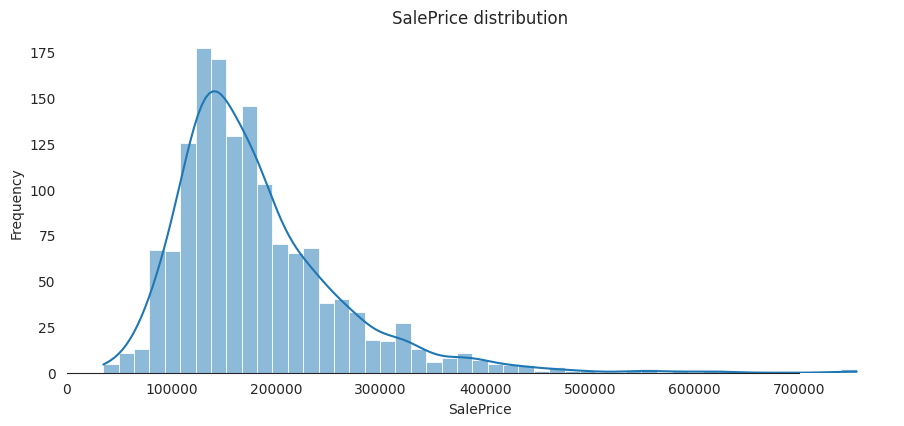

In [7]:
sns.set_style('white')
sns.set_color_codes(palette='deep')

# Create the distribution plot using displot
plot = sns.displot(data=train, x='SalePrice', kde=True)

# Access the underlying figure and axis objects
fig = plot.fig
ax = fig.gca()

fig.set_size_inches(10, 4)
ax.xaxis.grid(False)
ax.set_title("SalePrice distribution")
ax.set_ylabel("Frequency")
ax.set_xlabel("SalePrice")
sns.despine(trim=True, left=True)

plt.show()

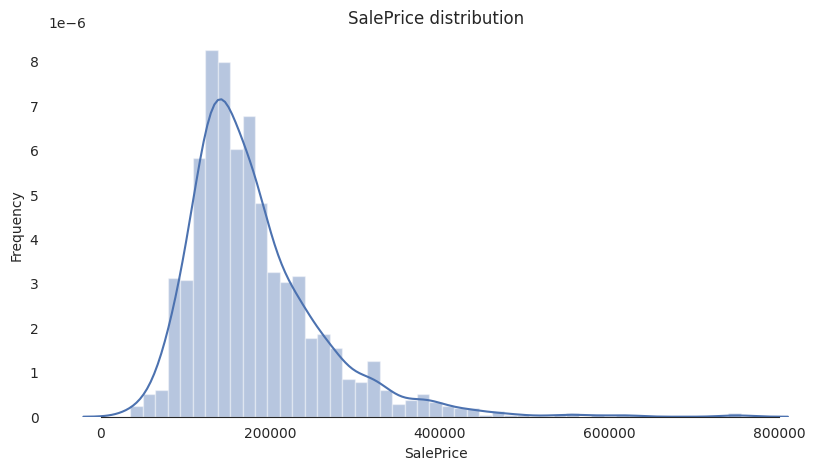

In [8]:
sns.set_style('white')
sns.set_color_codes(palette='deep')

# Create the distribution plot using distplot
plot = sns.distplot(train["SalePrice"], color='b')

# Access the underlying figure and axis objects
fig = plot.get_figure()
ax = fig.gca()

fig.set_size_inches(10, 5)

ax.xaxis.grid(False)
ax.set_title("SalePrice distribution")
ax.set_ylabel("Frequency")
ax.set_xlabel("SalePrice")
sns.despine(trim=True, left=True)

plt.show()

In [9]:
# check the new distribution
fig = px.histogram(train, x="SalePrice", title="SalePrice distribution")
fig.update_layout(yaxis_title="Frequency", xaxis_title="SalePrice", title="SalePrice distribution")
fig.show()

## ✨💡🌟
___
**Remark**
*The histogram indicates that the SalePrice data is left-skewed, with a higher frequency of higher-priced sales compared to lower-priced sales. The most common SalePrice range appears to be around 200k to 300k, as indicated by the tallest bars on the histogram. As the SalePrice decreases below 200k and increases above 300k, the frequency decreases, showing a pattern of fewer sales at lower and higher prices. Overall, the histogram provides a visual representation of the distribution of SalePrice data in the dataset, indicating a left-skewed distribution.*

A **pattern** refers to a recognizable and consistent way in which something is arranged, organized, or occurs. In the context of data analysis and statistics, a pattern often refers to a discernible trend, structure, or relationship within the data.

Here are some common types of patterns that can be identified in data analysis:

*Trend*: A pattern where data points show a consistent increase, decrease, or stability over time or across a variable.

*Seasonality*: A pattern that repeats at regular intervals, such as daily, weekly, monthly, or yearly cycles.

*Cyclical*: Patterns that repeat over longer periods, often with irregular intervals.

*Correlation*: A pattern where changes in one variable are associated with changes in another variable.

*Outliers*: Data points that deviate significantly from the overall pattern or distribution of the data.

*Clusters*: Groups of data points that are close together in space or time, indicating a specific subgroup or category within the data.

Identifying and understanding patterns in data is crucial for making informed decisions, uncovering insights, and building predictive models in various fields such as finance, marketing, healthcare, and research. Data visualization techniques, statistical analysis, and machine learning algorithms are commonly used to detect and interpret patterns in data.

# 🤔 So, what does skewness and kurtosis means
___
In French, *"skewness"* is translated as *"asymétrie"* and "kurtosis" is translated as "kurtosis" or "aplatissement" in the context of statistics. These terms are used to describe the shape of a probability distribution.

 - **"Asymétrie" (skewness)** refers to the lack of symmetry in a probability distribution. A distribution is considered skewed if it lacks symmetry, meaning the distribution does not have a mirror image about the mean. Skewness can be positive (positively skewed), negative (negatively skewed), or zero (symmetric).

 - **"Kurtosis" (kurtosis)** or "aplatissement" refers to the degree of peakedness or flatness of a probability distribution compared to a normal distribution. High kurtosis indicates a relatively peaked distribution, while low kurtosis indicates a flatter distribution compared to the normal distribution.

These terms are fundamental in statistical analysis and are used to understand the shape and characteristics of data distributions.

Skewness and kurtosis are statistical measures that provide insights into the shape and distribution of a dataset.

**Skewness:**
   - Skewness measures the asymmetry of the data distribution.
   - If the skewness is:
      - 0: The data is perfectly symmetrical.
      - Positive: The data is right-skewed (tail on the right).
      - Negative: The data is left-skewed (tail on the left).
  
**Kurtosis:**
   - Kurtosis measures the peakedness or flatness of the data distribution.
   - If the kurtosis is:
      - 3: The data has a normal distribution (mesokurtic).
      - Greater than 3: The data is leptokurtic (peaked).
      - Less than 3: The data is platykurtic (flat).
  
  
Here are the mathematical formulas for calculating skewness and kurtosis that can help you understand and interpret these statistical measures.

1. **Skewness (γ):**

    - Skewness measures the asymmetry of the data distribution.

    - The formula for skewness is calculated as the third standardized moment of the data.

    - For a sample with $n$ data points $x_1, x_2, ..., x_n$, the skewness is calculated as: $$\text{Skewness} = \frac{\frac{1}{n} \sum_{i=1}^{n} (x_i - \bar{x})^3}{s^3}$$

    where $\bar{x}$ is the sample mean and $s$ is the sample standard deviation.

2. **Kurtosis (κ):**

    - Kurtosis measures the flatness or peakedness of the data distribution.

    - The formula for kurtosis is calculated as the fourth standardized moment of the data.

    - For a sample with $n$ data points $x_1, x_2, ..., x_n$, the kurtosis is calculated as:  $$\text{Kurtosis} = \frac{\frac{1}{n} \sum_{i=1}^{n} (x_i - \bar{x})^4}{s^4}$$
    

These formulas provide a mathematical representation of skewness and kurtosis, allowing you to calculate these measures for a given dataset and gain insights into the shape and characteristics of the data distribution.

By printing the skewness and kurtosis values, you can gain insights into the shape and characteristics of the "SalePrice" distribution in the dataset. Positive skewness indicates a right-skewed distribution, while kurtosis values above or below 3 indicate the peakedness or flatness of the distribution, respectively.

In [10]:
# Skewness and Kurtosis calculation
print(f"Skewness: {train['SalePrice'].skew()}\nKurtosis: {train['SalePrice'].kurt()}")

Skewness: 1.8828757597682129
Kurtosis: 6.536281860064529


Based on the calculated skewness and kurtosis values for the "SalePrice" data in the `train` dataset:

1. **Skewness (1.88):**
   - The positive skewness value of 1.88 indicates that the distribution of the "SalePrice" data is right-skewed.
   - This suggests that there is a longer tail on the right side of the distribution, meaning that there are more data points with higher sale prices compared to the lower sale prices.
   - The skewness value being greater than 0 indicates a moderate to strong right-skewness in the data.

2. **Kurtosis (6.54):**
   - The kurtosis value of 6.54 indicates that the distribution of the "SalePrice" data is leptokurtic.
   - Leptokurtic distributions have heavier tails and a sharper peak compared to a normal distribution (which has a kurtosis of 3).
   - A kurtosis value greater than 3 suggests that the distribution has more outliers and extreme values than a normal distribution.

**Conclusion:**
   - The "SalePrice" data in the `train` dataset exhibits a right-skewed distribution with a moderate to strong positive skewness (1.88) and a leptokurtic distribution with heavier tails and a sharper peak (kurtosis of 6.54).
   - The presence of outliers and a concentration of values towards the higher end of sale prices contribute to the observed skewness and kurtosis values.
   - Understanding these characteristics of the data distribution is important for further analysis and modeling to account for the non-normality and potential impact of outliers on statistical inference and predictive modeling.

# ⚙️Features

## ➗split numericals and categorical columns

In [11]:
# Finding features
columns = train.columns
numerical = []
categorical = []

for elt in columns:
    if train[elt].dtype == 'O':
        categorical.append(elt)
    else:
        numerical.append(elt)
        
print(f"Numeric : {numerical}  \n--> length = {len(numerical)} numerical columns")
print(f"Categorie : {categorical}  \n---> length = {len(categorical)} categorical columns")

Numeric : ['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']  
--> length = 38 numerical columns
Categorie : ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Funct

In [12]:
train[numerical].head(10)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


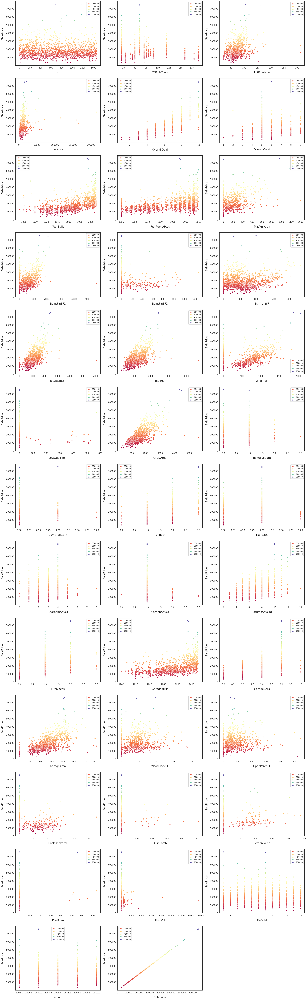

In [13]:
# numeric
# Visualising outliers in the data values
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(12, 120))
plt.subplots_adjust(right=2)
plt.subplots_adjust(top=2)
sns.color_palette("husl", 8)

for i, feature in enumerate(list(train[numerical]), 1):
    plt.subplot(len(list(numerical)), 3, i)
    sns.scatterplot(x=feature, y='SalePrice', hue='SalePrice', palette='Spectral', data=train)
    
    plt.xlabel(f"{feature}", size=15, labelpad=12.5)
    plt.ylabel('SalePrice', size=15, labelpad=12.5)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
        
    plt.legend(loc='best', prop={'size' : 10})

plt.show()

The plot generated in the provided code helps visualize potential outliers in the data. By creating scatter plots of numerical features against the target variable "SalePrice," you can visually identify data points that deviate significantly from the overall pattern or distribution of the data.

Here's how the plot helps in identifying outliers:

1. **Outliers Detection:**
   - Outliers are data points that are significantly different from other data points in the dataset.
   - In the scatter plot, outliers may appear as data points that are far away from the general trend or cluster of points.
   - By visually inspecting the scatter plot, you can identify data points that are potential outliers based on their position relative to the majority of the data points.
   

2. **Visual Inspection:**
   - The scatter plot allows you to visually inspect the relationship between each numerical feature and the target variable "SalePrice."
   - Unusual data points that do not follow the general pattern of the data may indicate the presence of outliers that need further investigation.
   

3. **Decision-Making:**
   - Identifying outliers is important for data cleaning, model building, and making informed decisions in data analysis.
   - Once outliers are identified, you can decide how to handle them, such as removing them, transforming the data, or applying robust modeling techniques.

By visually examining the scatter plot of numerical features against "SalePrice," you can effectively spot potential outliers in the dataset and take appropriate actions to address them in your analysis.

## 🌗Feature Correlation

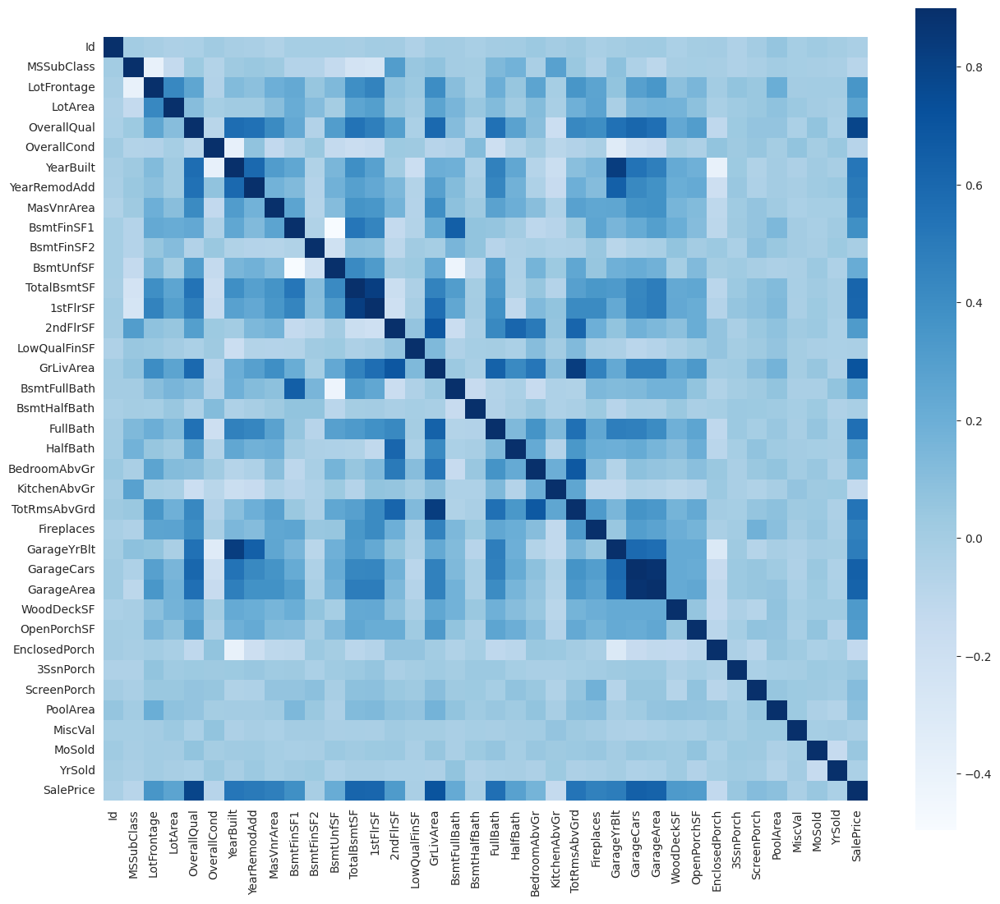

In [14]:
corr = train[numerical].corr()
plt.subplots(figsize=(15, 13))
sns.heatmap(corr, vmax=0.9, square=True, cmap="Blues")#, annot=True
#plt.savefig('corr.png')
plt.show()

Here are some insights you can gather from the correlation heatmap:

1. **Strength of Correlation:**
   - Darker shades of blue indicate a strong positive correlation between the corresponding pairs of features.
   - Lighter shades of blue indicate a weak or no correlation between the features.

2. **Positive and Negative Correlations:**
   - Positive correlations (close to 1) suggest that as one feature increases, the other feature tends to increase as well.
   - Negative correlations (close to -1) indicate that as one feature increases, the other feature tends to decrease.

3. **Feature Relationships:**
   - By examining the heatmap, you can identify which features are strongly related to each other and potentially redundant in a predictive model.
   - Features with high positive correlations may provide similar information and could lead to multicollinearity in regression models.

4. **Feature Selection:**
   - The heatmap can help in feature selection by identifying highly correlated features that can be removed to simplify the model without losing much information.
   - It allows you to prioritize features that have a stronger relationship with the target variable or with each other.

5. **Multicollinearity Detection:**
   - High correlations between features may indicate multicollinearity, which can affect the stability and interpretability of regression models.
   - Identifying and addressing multicollinearity is important for building robust predictive models.

Overall, the correlation heatmap provides valuable insights into the relationships between features in your dataset, helping you understand the interplay between variables and guiding feature selection and model building decisions.

# 📈Individual variable analysis
___

### Boxplot Analysis:

A boxplot is a graphical representation of the distribution of a dataset based on five key summary statistics: minimum, first quartile (Q1), median (Q2), third quartile (Q3), and maximum. Boxplots are useful for visualizing the spread and central tendency of the data and identifying outliers. Here's an explanation using mathematical formulas:

1. **Minimum (Min):** The smallest value in the dataset.
2. **First Quartile (Q1):** The value below which 25% of the data falls. It is the median of the lower half of the dataset.
3. **Median (Q2):** The middle value of the dataset when it is ordered from smallest to largest.
4. **Third Quartile (Q3):** The value below which 75% of the data falls. It is the median of the upper half of the dataset.
5. **Maximum (Max):** The largest value in the dataset.

The box in the boxplot represents the interquartile range (IQR), which is the range between the first and third quartiles (Q3 - Q1). The whiskers extend to 1.5 times the IQR from the first and third quartiles. Points beyond the whiskers are considered outliers.

### General Boxplot Analysis:

- **Identifying Outliers:** Boxplots help in identifying potential outliers in the dataset.
- **Comparing Groups:** Boxplots can be used to compare the distribution of a numerical variable across different categories or groups.
- **Central Tendency:** The median line in the boxplot represents the central tendency of the data.
- **Spread of Data:** The length of the box and whiskers show the spread of the data and the range of values.
- **Skewness:** Boxplots can provide insights into the skewness of the data distribution.

In summary, boxplots are valuable for visualizing the distribution of a numerical variable, identifying outliers, and comparing data across different groups or categories. They provide a concise summary of the data distribution and are useful for exploratory data analysis.

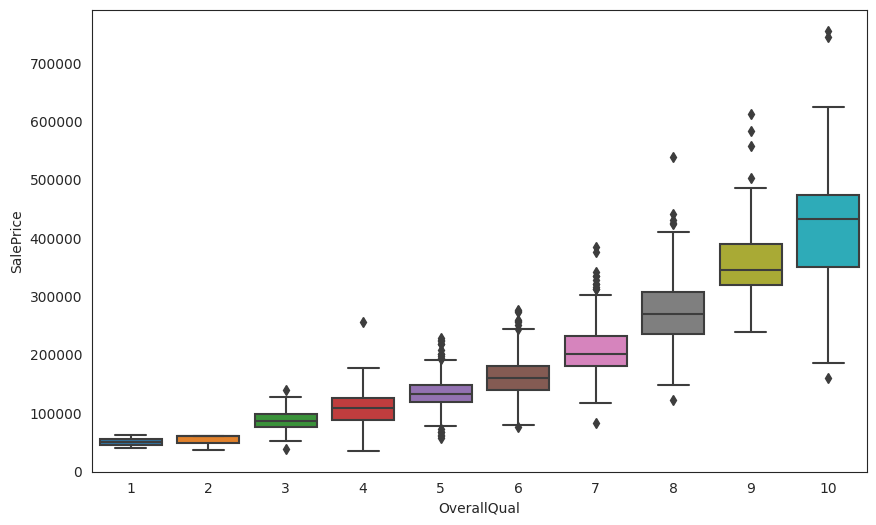

In [15]:
f, ax = plt.subplots(figsize=(10, 6))

fig = sns.boxplot(x='OverallQual', y='SalePrice', data=train)
#fig.axis(ymin=0, ymax=8000000)
plt.savefig('OverallQual_boxplot.png')
plt.show()

In [16]:
fig = px.box(train, x='OverallQual', y='SalePrice', points="all")
fig.show()

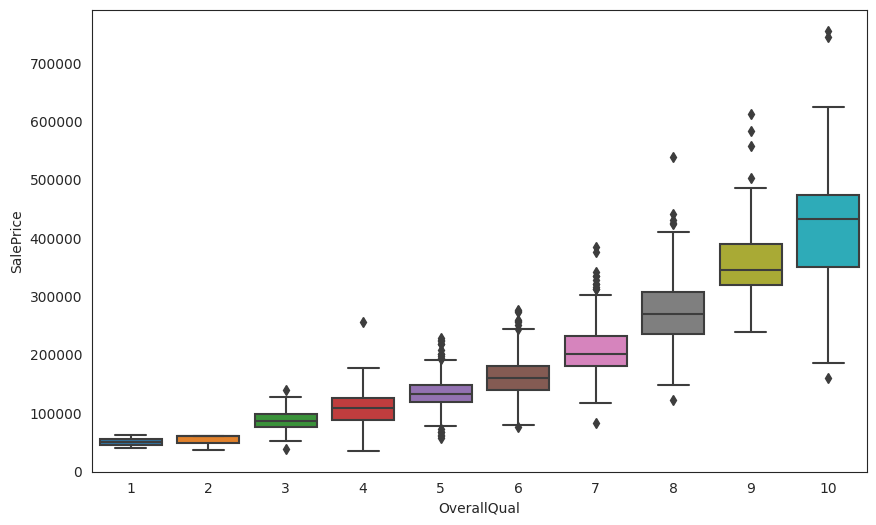

In [17]:
f, ax = plt.subplots(figsize=(10, 6))

fig = sns.boxplot(data=train, x='OverallQual', y='SalePrice')
#fig.axis(ymin=0, ymax=8000000)
plt.show()

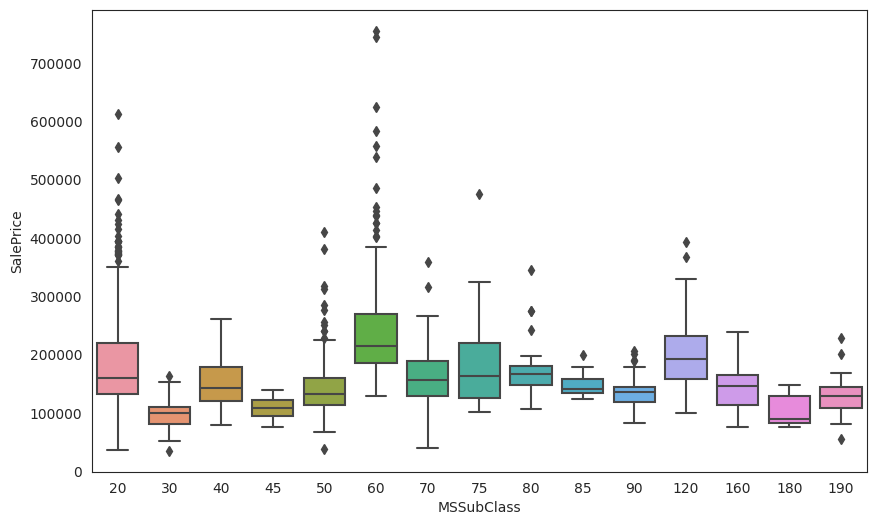

In [18]:
f, ax = plt.subplots(figsize=(10, 6))

fig = sns.boxplot(data=train, x='MSSubClass', y='SalePrice')
#fig.axis(ymin=0, ymax=8000000)
plt.show()

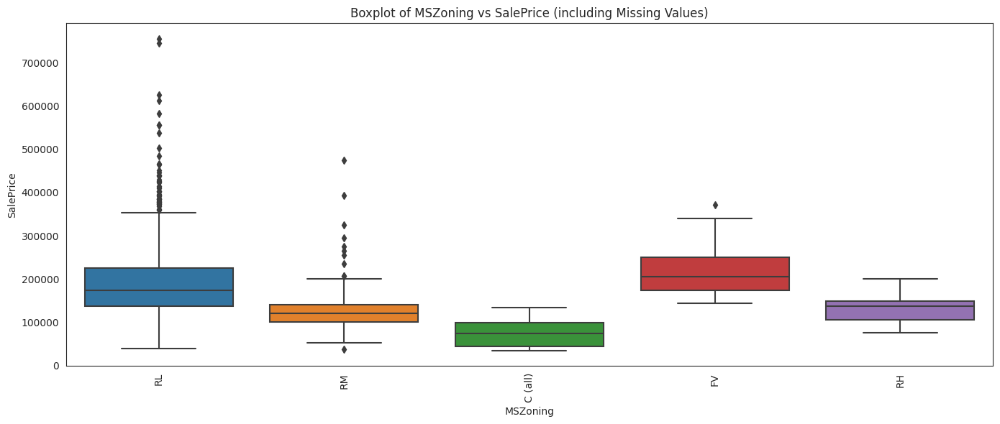

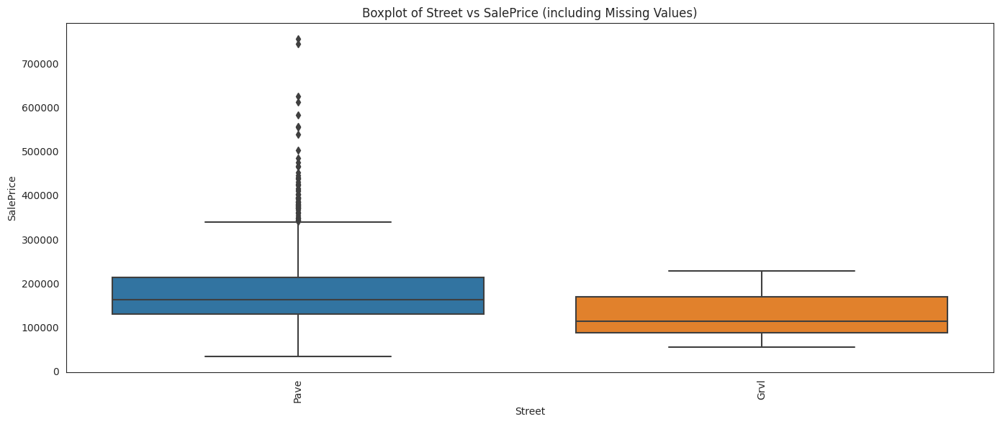

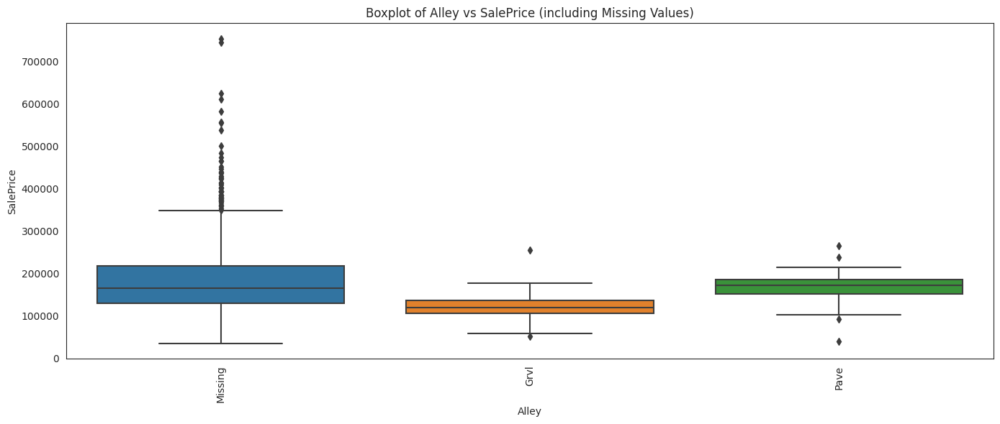

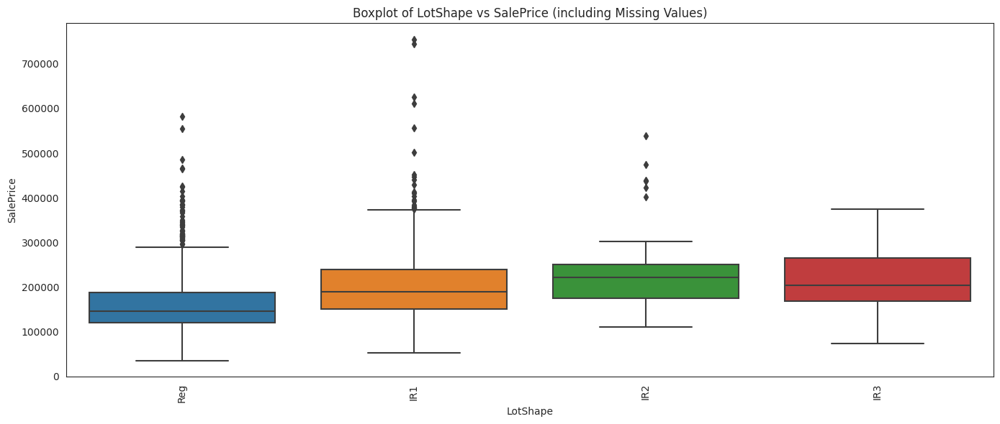

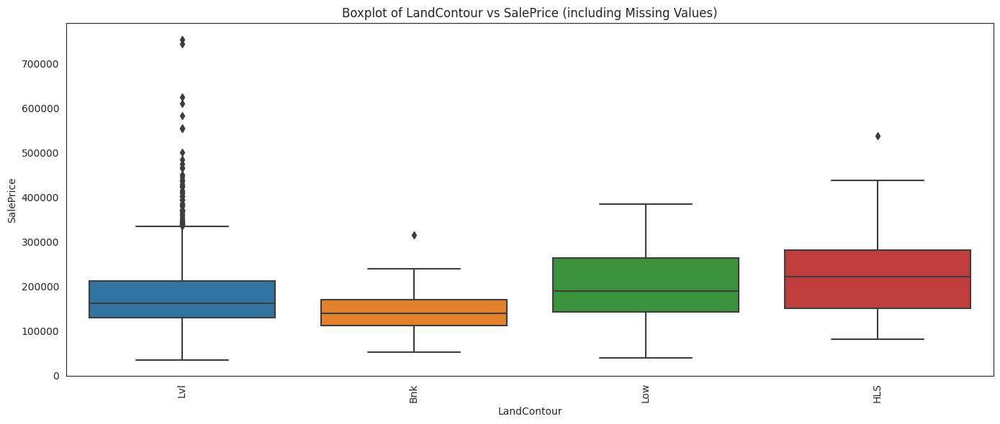

...

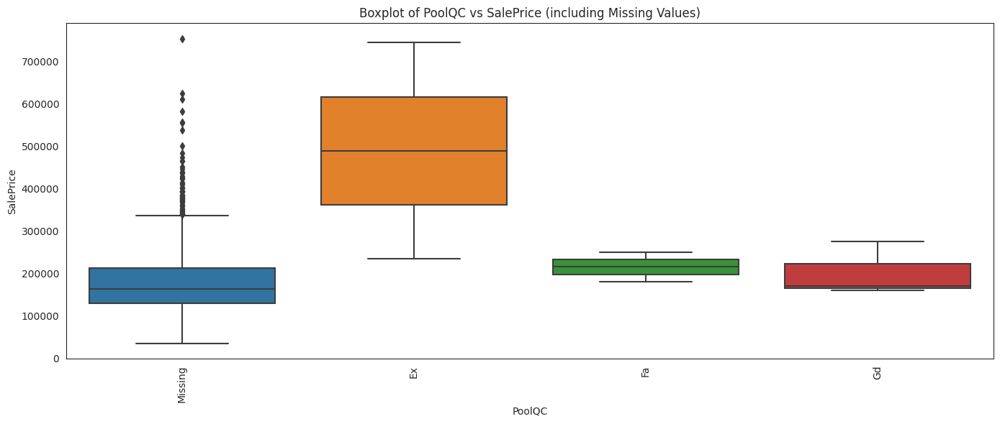

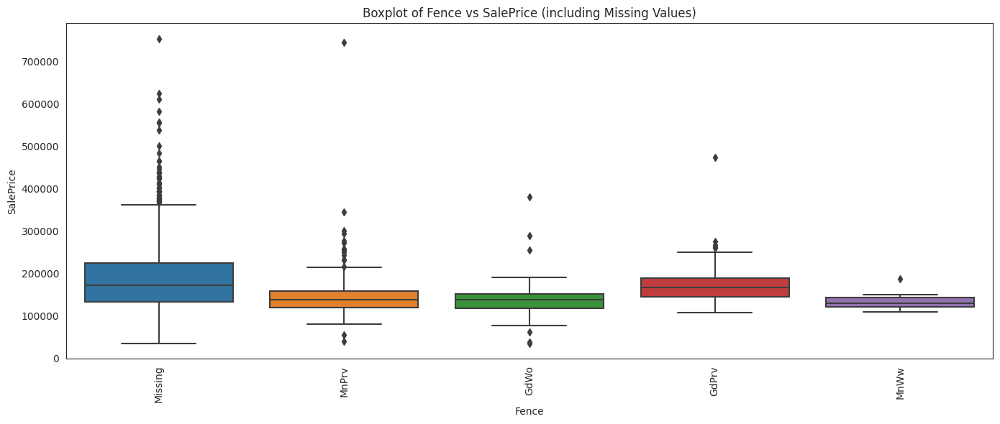

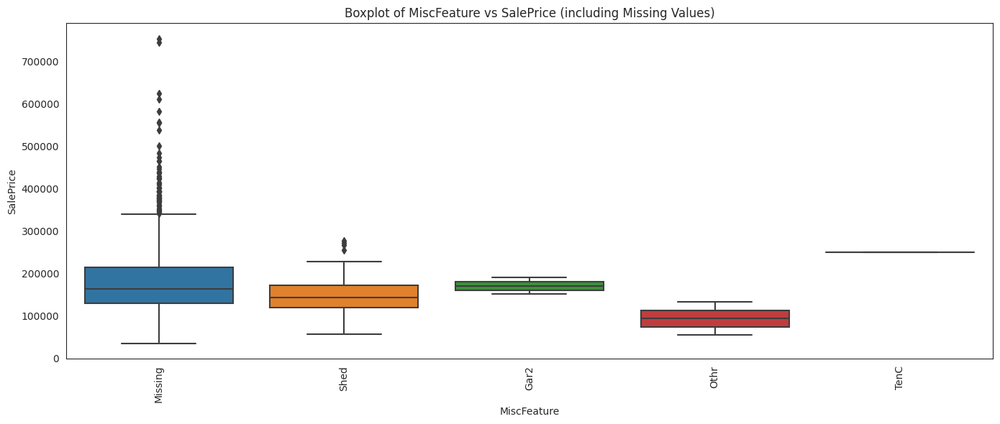

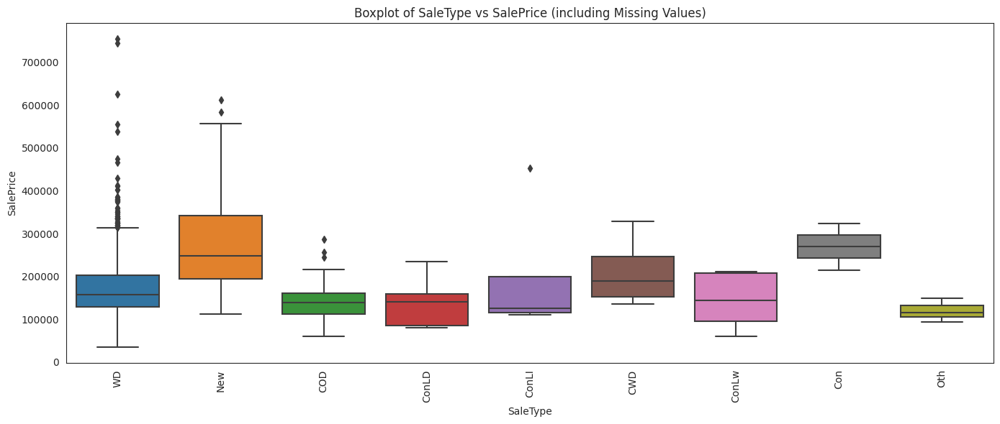

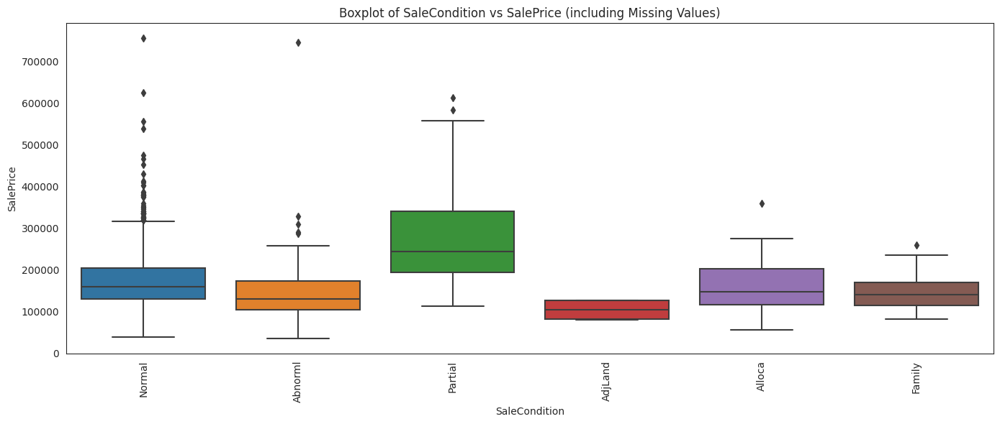

In [19]:
# Fill missing values in categorical columns with a specific category label
train_filled = pd.concat([train[categorical].fillna('Missing'), train['SalePrice']], axis=1)

# Iterate over each categorical column and plot a boxplot
for i, column in enumerate(categorical):
    # Create a new subplot for each boxplot
    fig, ax = plt.subplots(figsize=(14, 6))
    sns.boxplot(x=column, y='SalePrice', data=train_filled, ax=ax)
    ax.set_title(f'Boxplot of {column} vs SalePrice (including Missing Values)')
    
    #Rotate x-axis labels vertically
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')
    
    plt.tight_layout()
    plt.show()

Same boxplot using plotly, it's more interactive and useful

In [20]:
for column in categorical:
    fig = px.box(train_filled, x=column, y='SalePrice', title=f'Boxplot of {column} vs SalePrice (including Missing Values)')
    
    fig.update_xaxes(categoryorder='total ascending', title_text=column, tickangle=90)
    
    fig.show()

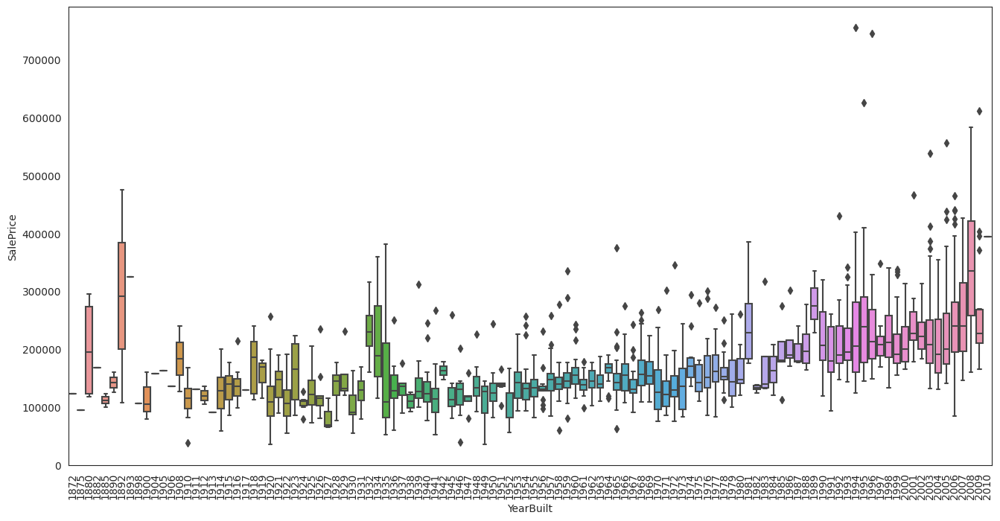

In [21]:
f, ax = plt.subplots(figsize=(16, 8))

sns.boxplot(x='YearBuilt', y='SalePrice', data=train, ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center')

plt.show()

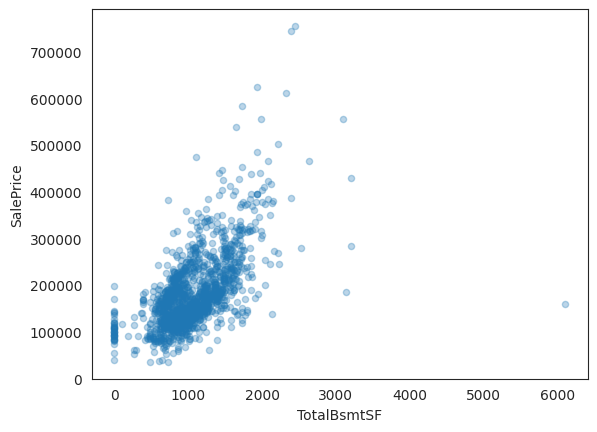

In [22]:
train.plot.scatter(x='TotalBsmtSF', y='SalePrice', alpha=0.3)
plt.show()

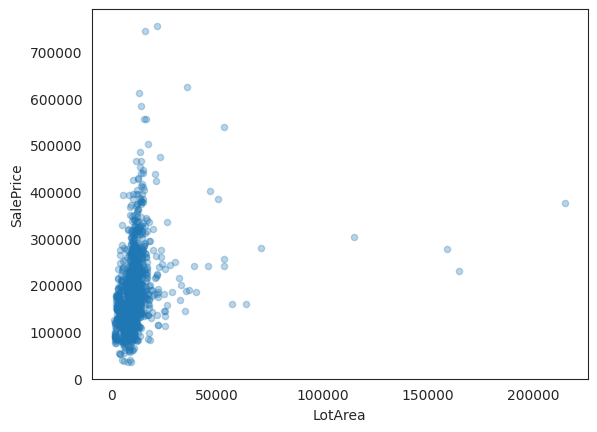

In [23]:
train.plot.scatter(x='LotArea', y='SalePrice', alpha=0.3)
plt.show()

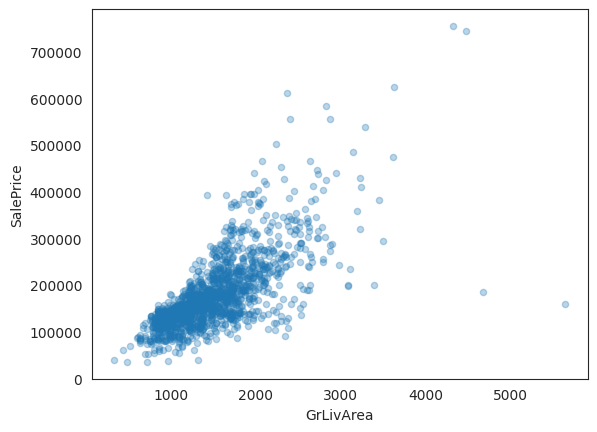

In [24]:
train.plot.scatter(x='GrLivArea', y='SalePrice', alpha=0.3)
plt.savefig('GrLivArea_scatter.png')
plt.show()

In [25]:
# Remove the Ids from train and test, as they are unique for each row and hence not useful for the model
train_ID = train['Id']
test_ID = test['Id']
train.drop(['Id'], axis=1, inplace=True)
test.drop(['Id'], axis=1, inplace=True)
train.shape, test.shape

((1460, 80), (1459, 79))

# 👷🏻‍♂️Feature Engineering
___
Feature engineering is the process of selecting, transforming, and creating new features from raw data to improve the performance of machine learning models. It involves identifying the most relevant data attributes, combining existing features to create new ones, and applying transformations to make the data more suitable for modeling. Effective feature engineering can significantly enhance the predictive power of machine learning algorithms and is a crucial step in the data science pipeline.

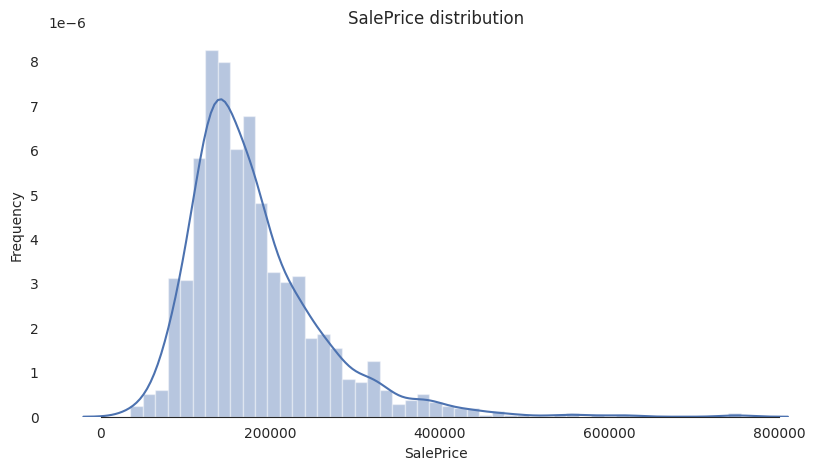

In [26]:
sns.set_style('white')
sns.set_color_codes(palette='deep')

# Create the distribution plot using distplot
plot = sns.distplot(train["SalePrice"], color='b')

# Access the underlying figure and axis objects
fig = plot.get_figure()
ax = fig.gca()

fig.set_size_inches(10, 5)

ax.xaxis.grid(False)
ax.set_title("SalePrice distribution")
ax.set_ylabel("Frequency")
ax.set_xlabel("SalePrice")
sns.despine(trim=True, left=True)

plt.show()

**Remark :**

The analysis of the SalePrice distribution indicates a right-skewed distribution with a concentration of prices in the lower to mid-range. The presence of outliers and the skewness towards higher prices may pose challenges in predictive modeling and statistical analysis. It is essential to consider the implications of this distribution in the context of the analysis and the goals of the project.

Based on this histogram of the SalePrice distribution, it is evident that the distribution is not normal. The distribution is skewed to the right, indicating that there is a higher frequency of higher-priced sales compared to lower-priced sales. In a normal distribution, the data would be symmetrically distributed around the mean, which is not the case here. The right-skewed distribution suggests that there are more data points with higher sale prices, leading to the non-normal distribution of SalePrice data.

In simpler terms, the presence of extremely high values on the right side of the histogram (right-skewed distribution) indicates that there are a few data points with very high sale prices compared to the majority of the data. This imbalance in the distribution of data, with a concentration of higher prices and fewer lower prices, can impact the overall shape of the distribution and may require special consideration when building predictive models. It's important to address this imbalance and consider its effects on the analysis and modeling process.

Here are some formulas and techniques that can be used to address the issue of a right-skewed distribution with extreme values in the SalePrice data:

1. **Log Transformation**:

    - Log transformation formula: $\log(x)$, $\log(x+1)$ or $\log_{e}(x)$  

    - Apply log transformation to the SalePrice data to reduce skewness and make the distribution more symmetrical.

2. **Box-Cox Transformation**:

    - Box-Cox transformation formula:  $$y(\lambda) = \begin{cases} \frac{y^\lambda - 1}{\lambda}, & \text{if } \lambda \neq 0 \\ \log(y), & \text{if } \lambda = 0 \end{cases}$$

    - Use the Box-Cox transformation to stabilize variance and make the data more normally distributed.

3. **Winsorization**:

    - Winsorization formula:

    - Lower bound: $\text{min}(x) = Q_{1} - k \times \text{IQR}$

    - Upper bound: $\text{max}(x) = Q_{3} + k \times \text{IQR}$

    - Winsorization replaces extreme values with less extreme values to reduce the impact of outliers.

4. **Z-Score Standardization**:

    - Z-score formula: $Z = \frac{x - \mu}{\sigma}$

    - Standardize the data by calculating the Z-score to center the data around the mean and scale it by the standard deviation.

5. **Robust Scaling**:

    - Robust scaling formula: $\frac{x - \text{median}(x)}{\text{IQR}(x)}$

    - Use robust scaling to scale the data by the interquartile range (IQR) to reduce the influence of outliers.

6. **Quantile Transformation**:

    - Quantile transformation formula:

    - Rank data points and assign them new values based on the desired distribution.

    - Transform the data to follow a normal distribution by mapping the observed data to a standard normal distribution.

These formulas and techniques can help address the skewness and extreme values in the SalePrice data, making the distribution more balanced and suitable for modeling purposes.



mu = 12.02 and sigma = 0.40



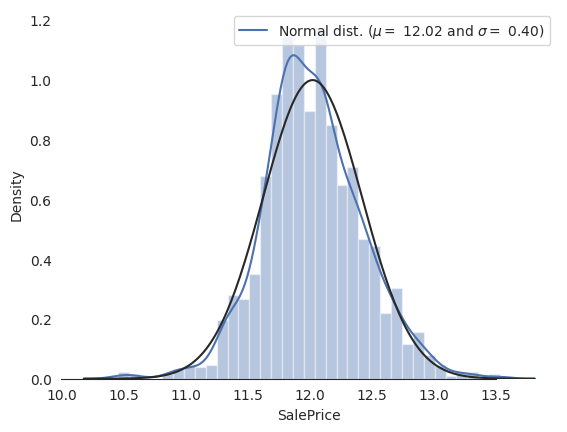

In [27]:
# log(x+1) tranform
train_transform = train.copy()
train_transform["SalePrice"] = np.log1p(train["SalePrice"])

# Plot 
sns.set_style('white')
sns.set_color_codes(palette='deep')

#check the new distribution
sns.distplot(train_transform["SalePrice"], fit=norm, color='b')

#Get the fitted parameters used by function
(mu, sigma) = norm.fit(train_transform["SalePrice"])
print("\nmu = {:.2f} and sigma = {:.2f}\n".format(mu, sigma))

# Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma =$ {:.2f})'.format(mu, sigma)], loc='best')
ax.xaxis.grid(False)
ax.set(ylabel="Frequency", xlabel="SalePrice", title="SalePrice distribution")
sns.despine(trim=True, left=True)
plt.show()

The $\log(x+1)$ transformation applied to the SalePrice data has resulted in a more normally distributed histogram, as shown in the graphic. The distribution appears to be closer to a normal distribution after the transformation, indicating that the log transformation has helped reduce the skewness in the data. The fitted parameters (mean and standard deviation) of the transformed data align well with a normal distribution, as indicated in the plot. This transformation is beneficial for preparing the data for modeling and analysis, as it addresses the issue of skewness and extreme values in the SalePrice data.

# 🧹Remove outliers
___

When removing outliers from your dataset, it's essential to consider the following factors to ensure a proper and effective outlier removal process:

1. **Understanding the Data**:
   - Have a clear understanding of the data and the context of the problem you are solving before deciding on outlier removal. Consider the domain knowledge and the impact of outliers on the analysis.

2. **Identification of Outliers**:
   - Use statistical methods like Z-Score, IQR (Interquartile Range), or visualization techniques like box plots and scatter plots to identify outliers in the dataset.

3. **Outlier Removal Criteria**:
   - Define clear criteria for identifying outliers based on statistical thresholds or domain-specific knowledge. Decide on the threshold beyond which data points are considered outliers.

4. **Impact on Analysis**:
   - Understand the potential impact of outlier removal on the analysis and modeling process. Consider how removing outliers may affect the distribution, relationships, and patterns in the data.

5. **Data Integrity**:
   - Ensure that the removal of outliers does not compromise the integrity of the dataset or introduce bias. Verify the reasons for outliers and ensure they are not valid data points.

6. **Data Size and Distribution**:
   - Consider the size of the dataset and the distribution of the data when deciding on the extent of outlier removal. Removing too many outliers can lead to loss of valuable information.

7. **Validation and Sensitivity Analysis**:
   - Validate the results of outlier removal through sensitivity analysis and model performance evaluation. Assess how the removal of outliers impacts the predictive performance of the models.

8. **Communication and Documentation**:
   - Clearly communicate the reasons for outlier removal and document the process followed. Document the criteria used for outlier removal and any assumptions made during the process.

9. **Iterative Process**:
   - Outlier removal is often an iterative process. Consider multiple rounds of outlier detection and removal to ensure that the dataset is cleaned effectively.

By taking these factors into account, you can ensure a systematic and informed approach to removing outliers from your dataset while maintaining the integrity and quality of the data for further analysis and modeling.

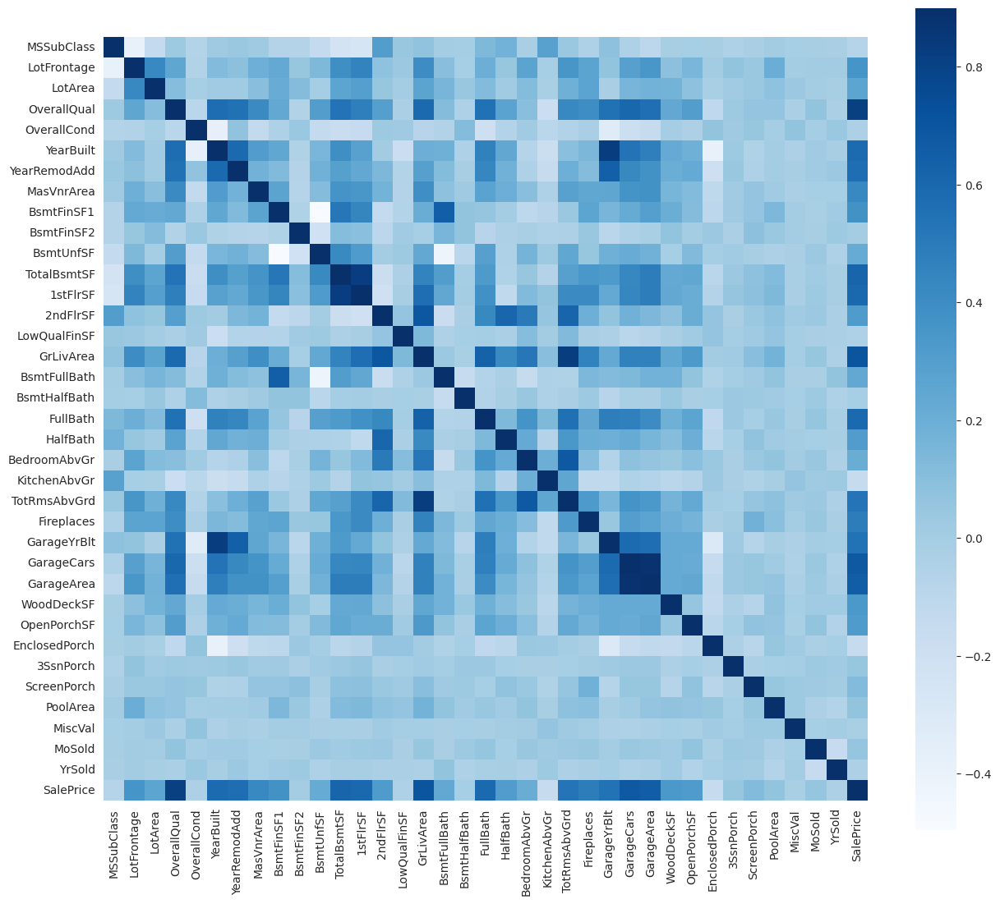

In [28]:
corr = train_transform[numerical[1:]].corr()
plt.subplots(figsize=(15, 13))
sns.heatmap(corr, vmax=0.9, square=True, cmap="Blues")#, annot=True
plt.show()

To efficiently remove outliers based on the provided boxplot visualization, you should consider focusing on the following features for outlier removal:

1. **OverallQual**:
   - The OverallQual feature seems to have a significant impact on the SalePrice and may be a key factor contributing to outliers in the data. Consider analyzing outliers within each category of OverallQual to ensure a comprehensive outlier removal process.

2. **GrLivArea** (Above Ground Living Area):
   - The GrLivArea feature appears to have outliers, especially in the higher range of living area sizes. Outliers in this feature may significantly affect the SalePrice and should be carefully examined and possibly removed.

3. **TotalBsmtSF** (Total Basement Area):
   - TotalBsmtSF also shows potential outliers, particularly at higher values. Outliers in the total basement area may have an impact on the SalePrice prediction and should be considered for removal.

4. **YearBuilt**:
   - Although not directly visible in the boxplot, YearBuilt could also potentially contribute to outliers if there are extreme values related to the year of construction. Consider examining this feature for outliers as well.

### 🚨Important
___
For me, it's important to consider the data context and the importance of the feature. For example:

OverallQual: Rates the overall material and finish of the house

   - 10: Very Excellent
   - 9: Excellent
   - 8: Very Good
   - 7: Good
   - 6: Above Average
   - 5: Average
   - 4: Below Average
   - 3: Fair
   - 2: Poor
   - 1: Very Poor

We have ten different classes that are important. In my DataFrame here, it's considered as a numerical class, so we cannot just remove the outliers without taking into account each class's importance and their distribution.

If you remember, we have already analyzed the scatter plot of GrLivArea where the group of points is clustered under around 4500 GrLivArea and SalePrice under 300000. Therefore, we will remove those data points.

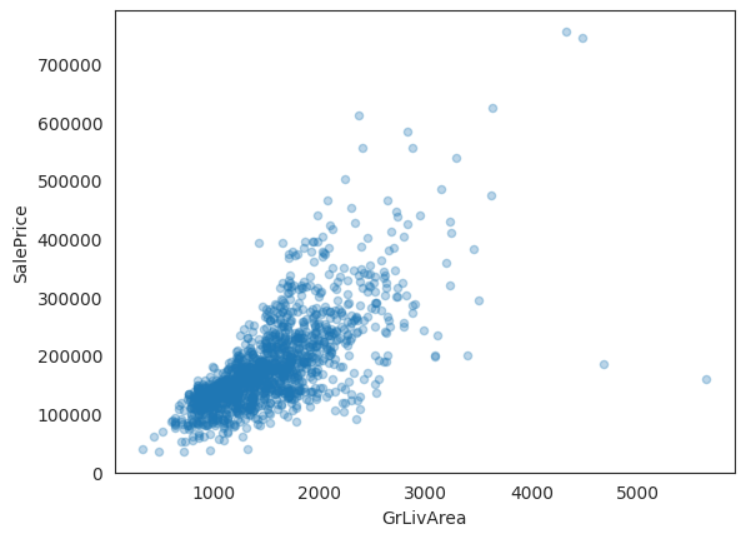

Similarly, for OverallQual, we have identified outliers where SalePrice is over 2000000 and OverallQual is under 5. We will remove these outliers as well.

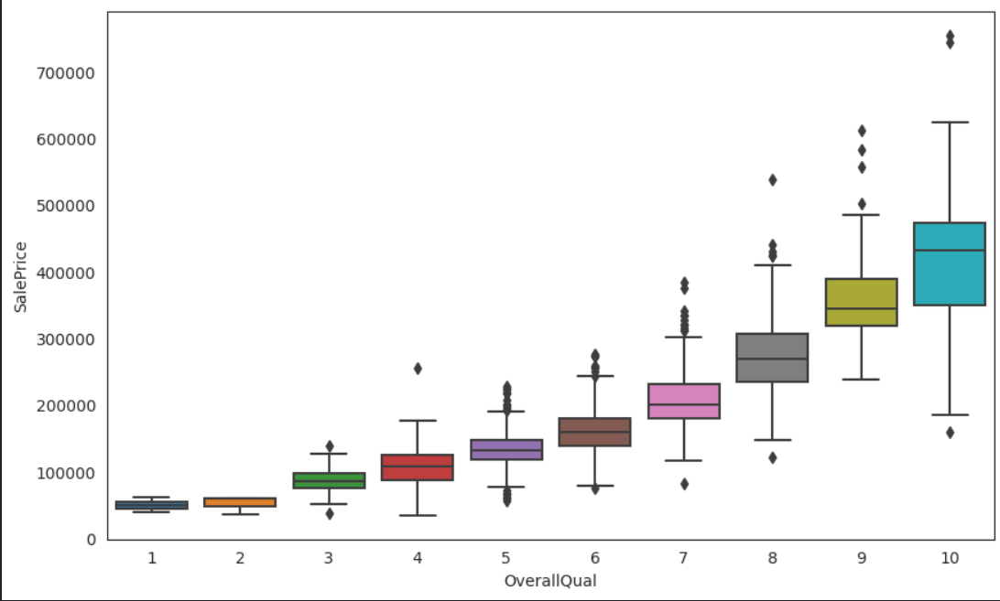


In [29]:
# Remove outliers
train_transform.drop(train_transform[(train_transform['OverallQual']<5) & (train_transform['SalePrice']>200000)].index, inplace=True)
train_transform.drop(train_transform[(train_transform['GrLivArea']>4500) & (train_transform['SalePrice']<300000)].index, inplace=True)
train_transform.reset_index(drop=True, inplace=True)

In [30]:
# Split features and labels
train_labels = train_transform['SalePrice'].reset_index(drop=True)
train_features = train_transform.drop(['SalePrice'], axis=1)
test_features = test

# Combine train and test features in order to apply the feature transformation pipeline  to entire dataset
all_features = pd.concat([train_features, test_features]).reset_index(drop=True)
all_features.shape

(2917, 79)

# 🕵️‍♀️Handle Missing data

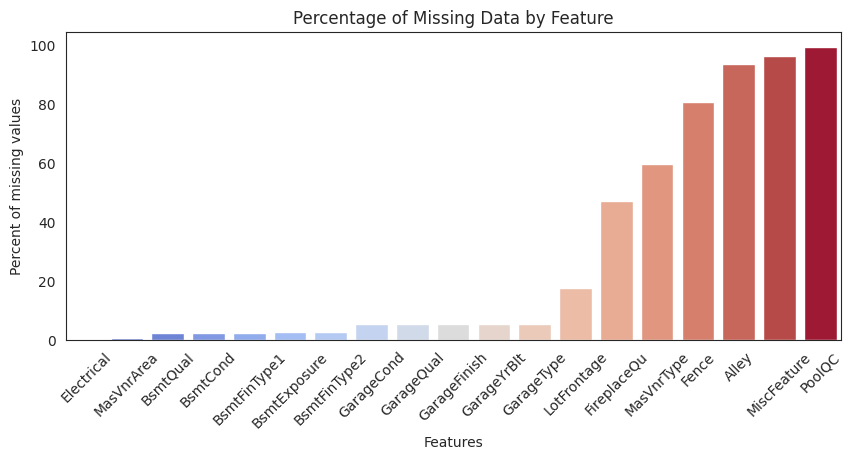

In [31]:
# Calculate the percentage of missing values for each feature
missing_percent = round(train.isnull().mean() * 100, 2)
missing_percent = missing_percent[missing_percent > 0]
missing_percent = missing_percent.sort_values()

# Create a color gradient based on the percentage of missing values
colors = plt.cm.coolwarm(np.linspace(0, 1, len(missing_percent)))

# Create the bar plot with color-coded bars
plt.figure(figsize=(10, 4))
bar_plot = sns.barplot(x=missing_percent.index, y=missing_percent, palette=colors)

# Add labels and title to the plot
plt.xlabel("Features")
plt.ylabel("Percent of missing values")
plt.title("Percentage of Missing Data by Feature")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

The image depicts a horizontal bar plot showing the percentage of missing data for various features in the dataset. Each bar represents a feature, and the length of the bar indicates the percentage of missing values for that feature. The colors of the bars range from blue to red, indicating the gradient of missing values.

The features are sorted in ascending order based on the percentage of missing data, with the feature "PoolQC" having the highest percentage of missing data, close to 100%. On the other hand, the feature "Electrical" has the lowest percentage of missing data, with a bar close to 0%.

The bar plot provides a visual representation of the extent of missing data for each feature, allowing for easy identification of features with a high proportion of missing values. This information is crucial for data preprocessing and quality assessment to ensure accurate and reliable analysis results.

In [32]:
# determine the threshold for missing values
def percent_missing(df):
    data = pd.DataFrame(df)
    df_cols = list(pd.DataFrame(data))
    dict_x = {}
    for i in range(0, len(df_cols)):
        dict_x.update({df_cols[i]: round(data[df_cols[i]].isnull().mean()*100,2)})
    
    return dict_x

missing = percent_missing(all_features)
df_miss = sorted(missing.items(), key=lambda x: x[1], reverse=True)
print('Percent of missing data')
df_miss[:15], len(df_miss)

Percent of missing data


([('PoolQC', 99.69),
  ('MiscFeature', 96.4),
  ('Alley', 93.21),
  ('Fence', 80.43),
  ('MasVnrType', 60.54),
  ('FireplaceQu', 48.68),
  ('LotFrontage', 16.66),
  ('GarageYrBlt', 5.45),
  ('GarageFinish', 5.45),
  ('GarageQual', 5.45),
  ('GarageCond', 5.45),
  ('GarageType', 5.38),
  ('BsmtCond', 2.81),
  ('BsmtExposure', 2.81),
  ('BsmtQual', 2.78)],
 79)

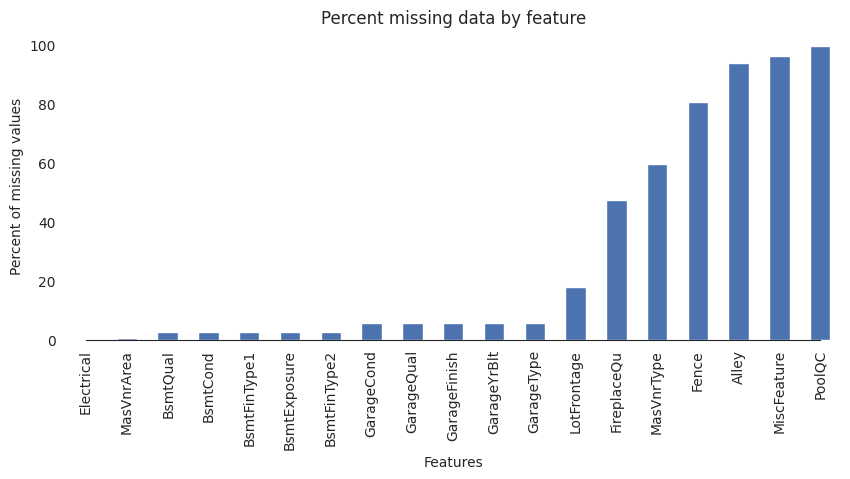

In [33]:
# Visualize missing values
sns.set_style("white")
f, ax = plt.subplots(figsize=(10, 4))
sns.set_color_codes(palette='deep')
missing = round(train.isnull().mean()*100,2)
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar(color="b")
# Tweak the visual presentation
ax.xaxis.grid(False)
ax.set(ylabel="Percent of missing values")
ax.set(xlabel="Features")
ax.set(title="Percent missing data by feature")
sns.despine(trim=True, left=True)

# 🏗🚨
___

Before delving into the process of handling missing values in your dataset, it is crucial to understand the nature of your data and how it is structured. This understanding plays a vital role in determining the appropriate strategies for dealing with missing values effectively. 

It is essential to recognize the different types of features in your dataset and their corresponding data types, as this knowledge informs the decisions regarding how missing values should be handled. The type of feature (categorical, numerical, or ordinal) influences the choice of imputation techniques and data preprocessing steps.

In the context of missing values, each feature may require a tailored approach based on its data type and the impact of missing values on the analysis. Categorical features may need different handling compared to numerical features, and understanding the nuances of each feature type is key to making informed decisions.

By comprehensively understanding the data input and the characteristics of the features, you can develop a structured approach to address missing values effectively. This proactive approach ensures that the data preprocessing steps align with the data types and requirements of the analysis, leading to more accurate and reliable results.

Therefore, it is important to emphasize the significance of understanding the data input and feature types in guiding the process of handling missing values. By gaining a thorough understanding of the dataset structure and feature types, you can make informed decisions on how to address missing values appropriately based on the specific characteristics of each feature.

So, converting certain numerical features like `MSSubClass`, `YrSold`, and `MoSold` into string (categorical) format can be beneficial in certain cases, especially when the numerical values represent categories or labels rather than continuous quantities. Here are some considerations for each feature:

1. **MSSubClass**:
   - The `MSSubClass` feature represents the type of dwelling involved in the sale, and the numerical values correspond to specific categories or classes. Converting `MSSubClass` to a string format can help in treating it as a categorical variable with distinct categories, making it easier to interpret and analyze.

2. **YrSold**:
   - The `YrSold` feature represents the year the property was sold. Converting `YrSold` to a string format may not provide significant benefits unless you want to treat the years as distinct categories rather than continuous values. If you intend to analyze sales trends over specific years, keeping it as a numerical feature may be more appropriate.

3. **MoSold**:
   - The `MoSold` feature represents the month the property was sold. Converting `MoSold` to a string format can be useful if you want to treat the months as categorical variables (e.g., "January," "February," etc.) instead of numerical values. This conversion can be helpful for seasonal analysis or visualization.

In summary, converting `MSSubClass` and `MoSold` into string format can be beneficial for treating them as categorical variables with distinct categories. However, for `YrSold`, keeping it as a numerical feature may be more suitable unless there are specific reasons to convert it into a string format. Consider the context of your analysis and how you intend to use these features to determine the most appropriate data type conversion.

In [34]:
# Columns where I want to make a modifications
modified_columns = ['MSSubClass', 'MoSold', 'Functional', 'YrSold', 'Electrical', 'KitchenQual', 'Exterior1st', 'Exterior2nd', 'SaleType',
                    'MSZoning', 'PoolQC', 'GarageYrBlt', 'GarageArea', 'GarageCars', 'GarageType',
                    'GarageFinish', 'GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
                    'BsmtFinType1', 'BsmtFinType2', 'LotFrontage']

# Print the unique values of the modified columns
for column in modified_columns:
    unique_values = all_features[column].unique()
    print(f"Unique values in '{column}': {unique_values}")

Unique values in 'MSSubClass': [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40 150]
Unique values in 'MoSold': [ 2  5  9 12 10  8 11  4  1  7  3  6]
Unique values in 'Functional': ['Typ' 'Min1' 'Maj1' 'Min2' 'Mod' 'Maj2' 'Sev' nan]
Unique values in 'YrSold': [2008 2007 2006 2009 2010]
Unique values in 'Electrical': ['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan]
Unique values in 'KitchenQual': ['Gd' 'TA' 'Ex' 'Fa' nan]
Unique values in 'Exterior1st': ['VinylSd' 'MetalSd' 'Wd Sdng' 'HdBoard' 'BrkFace' 'WdShing' 'CemntBd'
 'Plywood' 'AsbShng' 'Stucco' 'BrkComm' 'AsphShn' 'Stone' 'ImStucc'
 'CBlock' nan]
Unique values in 'Exterior2nd': ['VinylSd' 'MetalSd' 'Wd Shng' 'HdBoard' 'Plywood' 'Wd Sdng' 'CmentBd'
 'BrkFace' 'Stucco' 'AsbShng' 'Brk Cmn' 'ImStucc' 'AsphShn' 'Stone'
 'Other' 'CBlock' nan]
Unique values in 'SaleType': ['WD' 'New' 'COD' 'ConLD' 'ConLI' 'CWD' 'ConLw' 'Con' 'Oth' nan]
Unique values in 'MSZoning': ['RL' 'RM' 'C (all)' 'FV' 'RH' nan]
Unique values in 'PoolQC': [n

In [35]:
all_features['LotFrontage']

0        65.0
1        80.0
2        68.0
3        60.0
4        84.0
        ...  
2912     21.0
2913     21.0
2914    160.0
2915     62.0
2916     74.0
Name: LotFrontage, Length: 2917, dtype: float64

In [36]:
# Some of the non-numeric predictors are stored as numbers; convert them into strings 
all_features['MSSubClass'] = all_features['MSSubClass'].apply(str)
all_features['YrSold'] = all_features['YrSold'].astype(str)
all_features['MoSold'] = all_features['MoSold'].astype(str)

In [37]:
def handle_missing(features):
    # the data description states that NA refers to typical ('Typ') values
    features['Functional'] = features['Functional'].fillna('Typ')
    # Replace the missing values in each of the columns below with their mode
    features['Electrical'] = features['Electrical'].fillna("SBrkr")
    features['KitchenQual'] = features['KitchenQual'].fillna("TA")
    features['Exterior1st'] = features['Exterior1st'].fillna(features['Exterior1st'].mode()[0])
    features['Exterior2nd'] = features['Exterior2nd'].fillna(features['Exterior2nd'].mode()[0])
    features['SaleType'] = features['SaleType'].fillna(features['SaleType'].mode()[0])
    features['MSZoning'] = features.groupby('MSSubClass')['MSZoning'].transform(lambda x: x.fillna(x.mode()[0]))
    
    # the data description stats that NA refers to "No Pool"
    features["PoolQC"] = features["PoolQC"].fillna("None")
    # Replacing the missing values with 0, since no garage = no cars in garage
    for col in ('GarageYrBlt', 'GarageArea', 'GarageCars'):
        features[col] = features[col].fillna(0)
    # Replacing the missing values with None
    for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
        features[col] = features[col].fillna('None')
    # NaN values for these categorical basement features, means there's no basement
    for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
        features[col] = features[col].fillna('None')
        
    # Group the by neighborhoods, and fill in missing value by the median LotFrontage of the neighborhood
    features['LotFrontage'] = features.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

    # We have no particular intuition around how to fill in the rest of the categorical features
    # So we replace their missing values with None
    objects = []
    for i in features.columns:
        if features[i].dtype == object:
            objects.append(i)
    features.update(features[objects].fillna('None'))
        
    # And we do the same thing for numerical features, but this time with 0s
    numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric = []
    for i in features.columns:
        if features[i].dtype in numeric_dtypes:
            numeric.append(i)
    features.update(features[numeric].fillna(0))    
    return features

all_features = handle_missing(all_features)

Grouping by 'Neighborhood' for 'LotFrontage' and by 'MSSubClass' for 'MSZoning' before filling missing values with the median or mode is a common strategy to impute missing values based on similar characteristics within these groups. Here's why this approach is used:

1. **LotFrontage by Neighborhood**:
   - The 'LotFrontage' feature represents the linear feet of street connected to a property. By grouping 'LotFrontage' by 'Neighborhood', we assume that properties in the same neighborhood tend to have similar street frontage. Filling missing values with the median 'LotFrontage' value of the respective neighborhood helps maintain the integrity of the data by imputing values that are more representative of the specific neighborhood's characteristics.

2. **MSZoning by MSSubClass**:
   - The 'MSZoning' feature identifies the general zoning classification of the property sale. By grouping 'MSZoning' by 'MSSubClass', we leverage the relationship between the type of dwelling ('MSSubClass') and the zoning classification ('MSZoning'). Imputing missing values with the mode 'MSZoning' value of the corresponding 'MSSubClass' group ensures that the zoning classification is consistent with the specific type of dwelling, capturing any inherent patterns or dependencies between these features.

By utilizing the groupby operation before filling missing values, we take into account the inherent relationships and dependencies within the dataset to impute missing values more accurately. This approach helps preserve the underlying structure and characteristics of the data while handling missing values effectively based on relevant groupings.

Replacing all the remaining numeric missing values with 0 is a common practice in data preprocessing for numerical features. Here are some reasons for replacing missing values with 0 in numerical columns:

1. **Preserve Data Integrity**:
   - By filling missing values in numerical columns with 0, you maintain the integrity of the dataset and ensure that the data remains consistent. This approach prevents any disruptions in calculations or analyses that involve numerical features.

2. **Avoid Bias in Analysis**:
   - Missing values in numerical columns can impact statistical calculations and modeling. Imputing missing values with 0 ensures that the missing data does not skew the analysis or introduce bias in the results.

3. **Interpretation as Absence**:
   - In some cases, missing values in numerical features can be interpreted as the absence of a specific attribute or characteristic. By replacing missing values with 0, you explicitly indicate that the data point is missing or unavailable.

4. **Handling Missing Data**:
   - For numerical features where missing values are not specifically related to a certain category or group, replacing them with 0 is a simple and straightforward way to handle the missing data uniformly across all numeric columns.

5. **Compatibility with Algorithms**:
   - Some machine learning algorithms may not handle missing values well and require complete numerical data. Imputing missing values with 0 ensures that the dataset is ready for modeling without additional complexity.

While replacing missing values with 0 in numerical columns is a common practice, it is essential to consider the context of the data and the impact of this imputation strategy on the analysis. Understanding the data and the implications of imputing missing values with 0 helps ensure that the handling of missing data aligns with the goals and requirements of the analysis.

In [38]:
all_features.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal


In [39]:
# Check for missing values in all_features and calculate the sum of missing values for each column
missing_values = all_features.isna().sum()

# Create a DataFrame from the missing values series
missing_values_df = pd.DataFrame(missing_values, columns=['Missing_Values_Count'])

# Display the DataFrame showing the count of missing values for each column
missing_values_df

,Missing_Values_Count
MSSubClass,0
MSZoning,0
LotFrontage,0
LotArea,0
Street,0
...,...
MiscVal,0
MoSold,0
YrSold,0
SaleType,0


In [40]:
missing_values_df.sum()

Missing_Values_Count    0
dtype: int64

After thorough data preprocessing,there are no missing values present in the dataset anymore!

# 🛠️Fix skewed features
___

To fix skewed features in your dataset, you can apply transformations that help normalize the distribution of the data. Common transformations include logarithmic transformation, square root transformation, and Box-Cox transformation. Here's a general approach to fix skewed features:

1. **Identify Skewed Features**:
   - Calculate the skewness of each numerical feature in your dataset. Features with a skewness value greater than 0.5 or less than -0.5 are typically considered skewed.

2. **Apply Transformation**:
   - For positively skewed features (skewness > 0.5), you can apply transformations like logarithmic or square root transformation to make the distribution more symmetrical.
   - For negatively skewed features (skewness < -0.5), you can apply transformations like exponential transformation or Box-Cox transformation to normalize the distribution.

3. **Log Transformation**:
   - Logarithmic transformation is commonly used to reduce right-skewness in data. It is effective for features with exponential growth patterns.

4. **Square Root Transformation**:
   - Square root transformation is useful for reducing right-skewness in data and works well for features with non-negative values.

5. **Box-Cox Transformation**:
   - Box-Cox transformation is a more generalized power transformation that can handle both positive and negative skewness. It requires the data to be strictly positive.

6. **Apply Transformation**:
   - Apply the chosen transformation to the skewed features in your dataset. Remember to handle features with zero or negative values appropriately before applying certain transformations.

7. **Verify Distribution**:
   - After applying the transformation, verify the distribution of the features to ensure that the skewness has been reduced and the data is more normally distributed.

8. **Normalization**:
   - Normalizing the data can also help in fixing skewed features by scaling the values to a standard range. StandardScaler or MinMaxScaler can be used for normalization.

By following these steps and applying appropriate transformations, you can effectively fix skewed features in your dataset and prepare the data for further analysis or modeling. Remember to assess the impact of the transformations on the data and choose the most suitable approach based on the characteristics of the features.

In [41]:
# Fetch all numeric features
numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric = []
for i in all_features.columns:
    if all_features[i].dtype in numeric_dtypes:
        numeric.append(i)

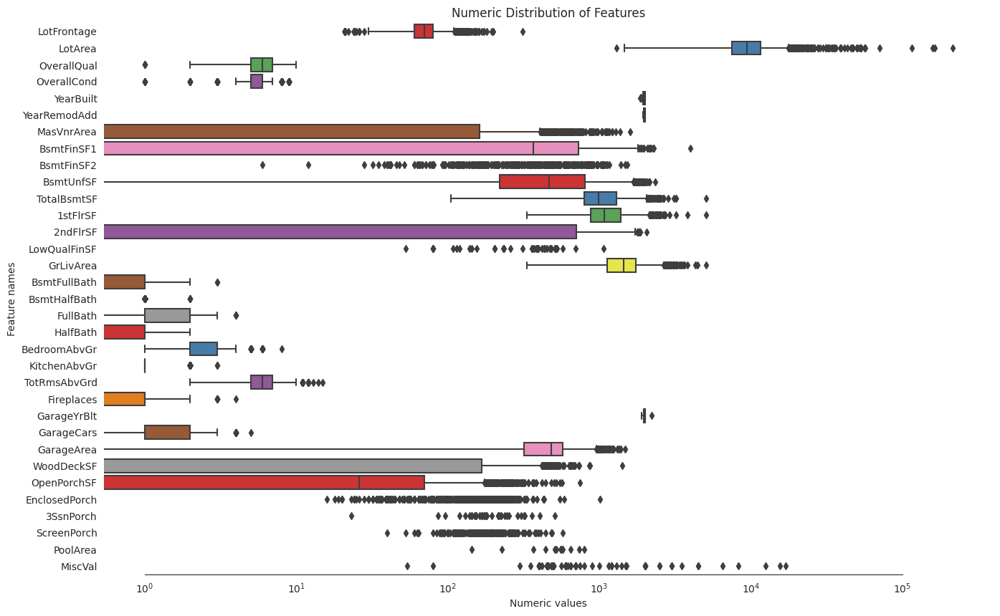

In [42]:
# Create box plots for all numeric features
sns.set_style("white")
f, ax = plt.subplots(figsize=(16, 10))
ax.set_xscale("log")
ax = sns.boxplot(data=all_features[numeric] , orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

In [43]:
# Find skewed numerical features
skew_features = all_features[numeric].apply(lambda x: skew(x)).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.5]
skew_index = high_skew.index

print("There are {} numerical features with Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
skew_features.head(10)

There are 25 numerical features with Skew > 0.5 :


MiscVal          21.939672
PoolArea         17.688664
LotArea          13.109495
LowQualFinSF     12.084539
3SsnPorch        11.372080
KitchenAbvGr      4.300550
BsmtFinSF2        4.144503
EnclosedPorch     4.002344
ScreenPorch       3.945101
BsmtHalfBath      3.929996
dtype: float64

Based on the analysis of the box plot and the other information:

**Positive Skewness**:
   - The box plots indicate positive skewness in several features, with a concentration of data points towards the lower end and outliers extending towards higher values. This skewness suggests that the data is not normally distributed.

**Identification of Outliers**:
   - The presence of outliers in the box plots can impact the skewness of the data distribution. Outliers may need to be addressed before applying transformations to fix skewness effectively.

**Skewness Correction**:
   - To address the positive skewness observed in the features, transformations such as logarithmic transformation, square root transformation, or Box-Cox transformation can be applied to normalize the distribution and reduce skewness.


In [44]:
skew_index

Index(['MiscVal', 'PoolArea', 'LotArea', 'LowQualFinSF', '3SsnPorch',
       'KitchenAbvGr', 'BsmtFinSF2', 'EnclosedPorch', 'ScreenPorch',
       'BsmtHalfBath', 'MasVnrArea', 'OpenPorchSF', 'WoodDeckSF', '1stFlrSF',
       'LotFrontage', 'GrLivArea', 'BsmtFinSF1', 'BsmtUnfSF', '2ndFlrSF',
       'TotRmsAbvGrd', 'Fireplaces', 'HalfBath', 'TotalBsmtSF', 'BsmtFullBath',
       'OverallCond'],
      dtype='object')

In [45]:
# Check for negative values in the features from the skew_index
negative_values = all_features[skew_index].lt(0).sum()
print(negative_values)

MiscVal          0
PoolArea         0
LotArea          0
LowQualFinSF     0
3SsnPorch        0
KitchenAbvGr     0
BsmtFinSF2       0
EnclosedPorch    0
ScreenPorch      0
BsmtHalfBath     0
MasVnrArea       0
OpenPorchSF      0
WoodDeckSF       0
1stFlrSF         0
LotFrontage      0
GrLivArea        0
BsmtFinSF1       0
BsmtUnfSF        0
2ndFlrSF         0
TotRmsAbvGrd     0
Fireplaces       0
HalfBath         0
TotalBsmtSF      0
BsmtFullBath     0
OverallCond      0
dtype: int64


### 🚜***We'll use the scipy function boxcox1p which computes the Box-Cox transformation. The goal is to find a simple transformation that lets us normalize data.***

The Box-Cox transformation is a statistical method used to stabilize variance and make the data more normally distributed. It is particularly useful when dealing with skewed data or data that violates the assumptions of normality in statistical analyses. Here's an explanation of the Box-Cox transformation, its role, and when to use it:

### *Box-Cox Transformation:*

1. **Mathematical Formula**:

    - The Box-Cox transformation is defined by the formula: $$y(\lambda) = \begin{cases} \frac{y^\lambda - 1}{\lambda}, & \text{if } \lambda \neq 0 \\ \log(y), & \text{if } \lambda = 0 \end{cases}$$

    where $y$ is the original data, and $\lambda$ is the transformation parameter that maximizes the log-likelihood function.

2. **Role of Box-Cox Transformation**:

    - **Normalize Data**: The Box-Cox transformation helps normalize the data by addressing skewness and making the distribution more symmetric.

    - **Stabilize Variance**: It stabilizes variance, making the spread of data points more consistent across the dataset.

    - **Improve Model Performance**: Normalizing the data using Box-Cox can enhance the performance of statistical models that assume normally distributed data.

3. **When to Use Box-Cox Transformation**:

    - **Skewed Data**: Use Box-Cox when dealing with skewed data that violates the assumption of normality.

    - **Homoscedasticity**: Apply Box-Cox to achieve homoscedasticity, where the variance of the data is constant across different levels of the independent variable.

    - **Statistical Analyses**: Use Box-Cox before performing parametric statistical tests that assume normality, such as linear regression or ANOVA.

4. **Optimal Lambda Value**:

    - The Box-Cox transformation requires finding the optimal lambda value that maximizes the log-likelihood function. This value determines the nature of the transformation applied to the data.

In summary, the Box-Cox transformation is a valuable tool in statistical analysis for normalizing data, stabilizing variance, and improving the performance of models that rely on normally distributed data. It is particularly useful in addressing skewed data and ensuring that the data meets the assumptions of parametric statistical tests.

In [46]:
# Normalize skewed features
#for i in skew_index:
    #all_features[i] = boxcox1p(all_features[i], boxcox_normmax(all_features[i] + 1))

The `sklearn.preprocessing.PowerTransformer()` function in scikit-learn can be used to perform a similar transformation to the Box-Cox transformation for normalizing skewed features. While the Box-Cox transformation is specifically designed for non-negative data and requires an optimal lambda parameter, the PowerTransformer in scikit-learn is more flexible and can handle both positive and negative values without the need for specifying a lambda parameter.

Here is how you can use `PowerTransformer()` to normalize skewed features in a similar manner to the Box-Cox transformation:

### How `PowerTransformer()` Works:
1. **Initialization**:
   - Initialize a PowerTransformer object with the specified method parameter set to 'yeo-johnson' for Yeo-Johnson transformation.

2. **Fitting and Transforming**:
   - Fit the PowerTransformer to the skewed features using `fit_transform()`. This step estimates the transformation parameters based on the data and applies the transformation to normalize the features.

3. **Normalization**:
   - The PowerTransformer applies the Yeo-Johnson transformation to the data, which helps normalize the skewed features and make the distribution more symmetrical.

4. **Flexibility**:
   - Unlike the Box-Cox transformation, the PowerTransformer in scikit-learn can handle both positive and negative values without the need for specifying an optimal lambda parameter.

By using `PowerTransformer()` with the 'yeo-johnson' method, you can achieve a similar normalization effect as the Box-Cox transformation for skewed features. This approach simplifies the transformation process and provides flexibility in handling skewed data in machine learning pipelines.

In [47]:
# Initialize PowerTransformer object
pt = PowerTransformer(method='yeo-johnson', standardize=False)

# Normalize skewed features using PowerTransformer
skewed_features_normalized = pt.fit_transform(all_features[skew_index])
all_features[skew_index] = skewed_features_normalized

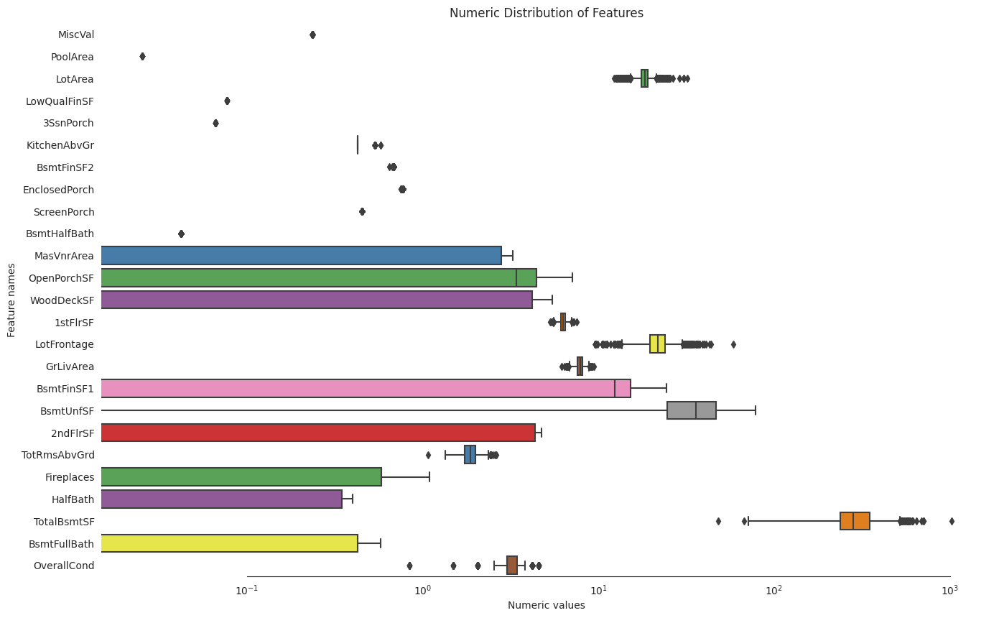

In [48]:
# Let's make sure we handled all the skewed values
sns.set_style("white")
f, ax = plt.subplots(figsize=(16, 10))
ax.set_xscale("log")
ax = sns.boxplot(data=all_features[skew_index] , orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

Based on the provided image of the box plot chart, it shows the distribution of features across different categories. The x-axis represents the 'Moment Distribution of Features' with a logarithmic scale ranging from 10^-2 to 10^3. Each category is represented by a colored box plot with the interquartile range (IQR), median line, whiskers, and outliers.

The chart reveals the variability in the distribution of features among the 20 categories listed on the y-axis. Some categories have tightly clustered data points around the median with few outliers, while others exhibit wider variability with more outliers. For instance, the category "MesozPlank" has a high median value and numerous outliers, indicating a significant spread in the data.

Overall, the box plot chart effectively visualizes the central tendency, spread, and presence of outliers in the data for each category, providing valuable insights into the distribution of features. All the features look fairly normally distributed now.


# 🏡 Elevating Predictive Power: Crafting Intuitive Features for Enhanced Model Performance 🌟
___

Let's enhance our model's predictive power by crafting insightful features that capture the essence of the dataset. By leveraging our domain knowledge and intuition, we can engineer new attributes that encapsulate key aspects of each house, such as the combined area of floors, bathrooms, and porch areas. These engineered features will serve as valuable inputs to our machine learning algorithms, enabling them to uncover intricate patterns and make more accurate predictions.

In [49]:
all_features

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,20.767314,17.941175,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,3.011831,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.854908,Gd,TA,PConc,Gd,TA,No,GLQ,15.089890,Unf,-0.0,20.210472,252.287849,GasA,Ex,Y,SBrkr,6.092297,4.424197,-0.0,8.086352,0.427225,-0.00000,2,0.34646,3,0.427656,Gd,2.101584,Typ,-0.000000,None,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,-0.000000,4.307414,-0.000000,-0.0,-0.0,-0.0,None,None,None,-0.000000,2,2008,WD,Normal
1,20,RL,23.855714,18.387385,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,4.197446,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,-0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,16.581535,Unf,-0.0,27.943027,342.326360,GasA,Ex,Y,SBrkr,6.404851,-0.000000,-0.0,7.730168,-0.000000,0.04214,2,-0.00000,3,0.427656,TA,1.870643,Typ,0.583552,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,4.557433,0.000000,-0.000000,-0.0,-0.0,-0.0,None,None,None,-0.000000,5,2007,WD,Normal
2,60,RL,21.404124,18.953064,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,3.011831,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.806492,Gd,TA,PConc,Gd,TA,Mn,GLQ,13.511345,Unf,-0.0,34.522432,267.008817,GasA,Ex,Y,SBrkr,6.150628,4.429777,-0.0,8.137536,0.427225,-0.00000,2,0.34646,3,0.427656,Gd,1.870643,Typ,0.583552,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,-0.000000,3.910547,-0.000000,-0.0,-0.0,-0.0,None,None,None,-0.000000,9,2008,WD,Normal
3,70,RL,19.681741,18.368969,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,3.011831,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,-0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,10.513238,Unf,-0.0,38.459567,228.796842,GasA,Gd,Y,SBrkr,6.185840,4.375007,-0.0,8.091158,0.427225,-0.00000,1,-0.00000,3,0.427656,Gd,1.993644,Typ,0.583552,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,-0.000000,3.718922,0.769325,-0.0,-0.0,-0.0,None,None,None,-0.000000,2,2006,WD,Abnorml
4,60,RL,24.642609,19.822022,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,3.011831,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.988466,Gd,TA,PConc,Gd,TA,Av,GLQ,14.762062,Unf,-0.0,36.659088,317.125657,GasA,Ex,Y,SBrkr,6.326855,4.506874,-0.0,8.382542,0.427225,-0.00000,2,0.34646,4,0.427656,Gd,2.197701,Typ,0.583552,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,4.277659,4.652008,-0.000000,-0.0,-0.0,-0.0,None,None,None,-0.000000,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2912,160,RM,9.579061,13.318032,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,3.826054,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,-0.000000,TA,TA,CBlock,TA,TA,No,Unf,0.000000,Unf,-0.0,38.669567,177.084465,GasA,Gd,Y,SBrkr,5.725701,4.239679,-0.0,7.561390,-0.000000,-0.00000,1,0.34646,3,0.427656,TA,1.727813,Typ,-0.000000,None,None,0.0,None,0.0,0.0,None,None,Y,-0.000000,0.000000,-0.000000,-0.0,-0.0,-0.0,None,None,None,-0.000000,6,2006,WD,Normal
2913,160,RM,9.579061,13.256062,Pave,None,Reg,Lvl,Al

In [50]:
df = all_features[['TotalBsmtSF','2ndFlrSF', 'GarageCars', 'GarageArea', 'LotFrontage', 'MasVnrArea', 'BsmtFinSF1']]
df

,TotalBsmtSF,2ndFlrSF,GarageCars,GarageArea,LotFrontage,MasVnrArea,BsmtFinSF1
0,252.287849,4.424197,2.0,548.0,20.767314,2.854908,15.089890
1,342.326360,-0.000000,2.0,460.0,23.855714,-0.000000,16.581535
2,267.008817,4.429777,2.0,608.0,21.404124,2.806492,13.511345
3,228.796842,4.375007,3.0,642.0,19.681741,-0.000000,10.513238
4,317.125657,4.506874,3.0,836.0,24.642609,2.988466,14.762062
...,...,...,...,...,...,...,...
2912,177.084465,4.239679,0.0,0.0,9.579061,-0.000000,0.000000
2913,177.084465,4.239679,1.0,286.0,9.579061,-0.000000,11.041137
2914,334.199239,-0.000000,2.0,576.0,37.686069,-0.000000,17.674602
2915,265.181108,-0.000000,0.0,0.0,20.119759,-0.000000,12.088715


In [51]:
df.describe()

,TotalBsmtSF,2ndFlrSF,GarageCars,GarageArea,LotFrontage,MasVnrArea,BsmtFinSF1
count,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000
mean,291.047288,1.866758,1.765513,472.247515,21.457328,1.116400,9.457819
std,97.831890,2.160053,0.762102,214.762268,4.424521,1.387667,6.990171
min,0.000000,-0.000000,0.000000,0.000000,9.579061,-0.000000,0.000000
25%,237.562482,0.000000,1.000000,320.000000,19.681741,0.000000,0.000000
50%,282.409254,0.000000,2.000000,480.000000,21.823010,0.000000,12.419872
75%,350.824260,4.345874,2.000000,576.000000,23.855714,2.808093,15.256093
max,1023.799280,4.757450,5.000000,1488.000000,58.313541,3.256404,24.478847


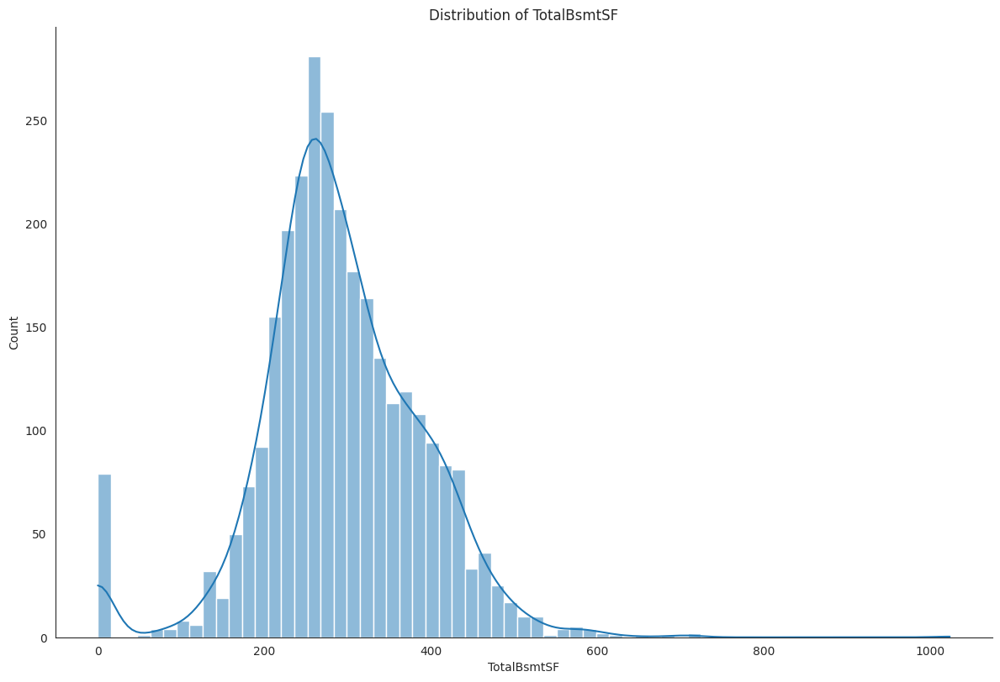

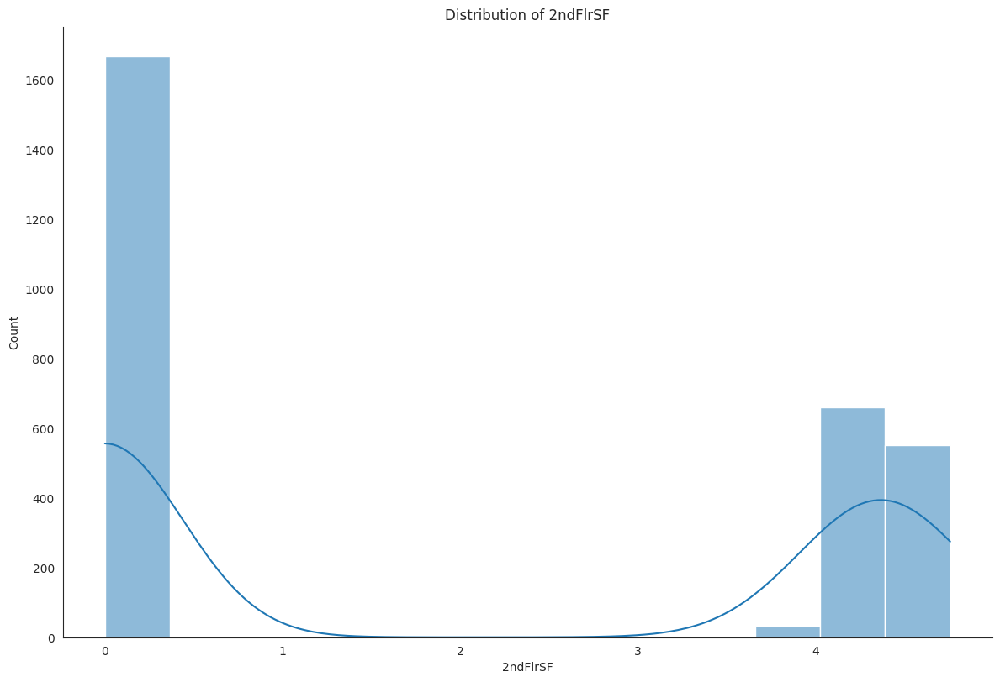

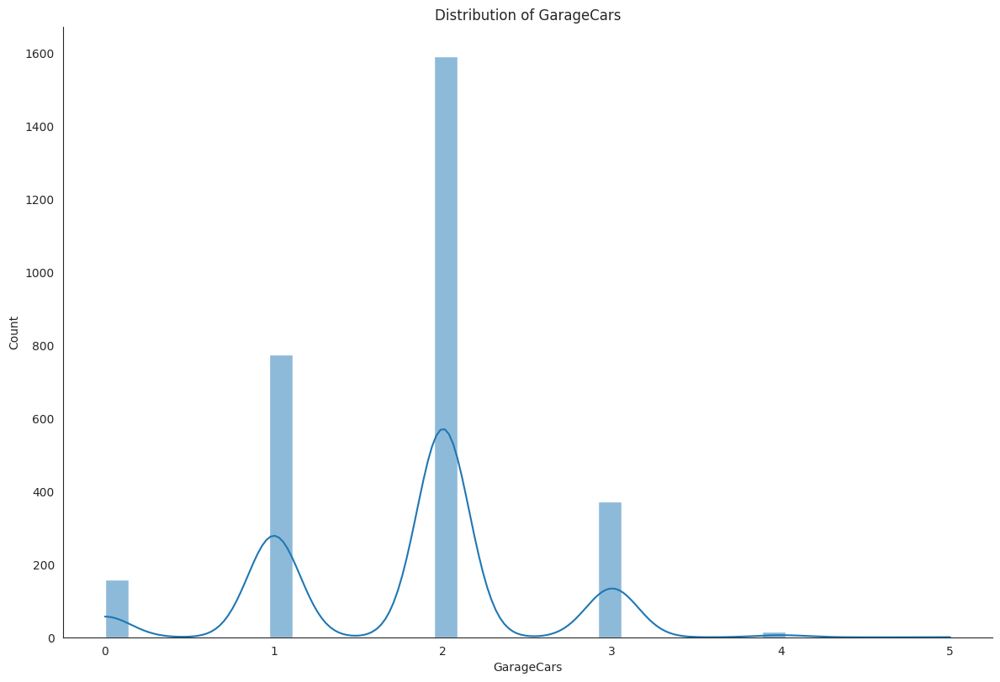

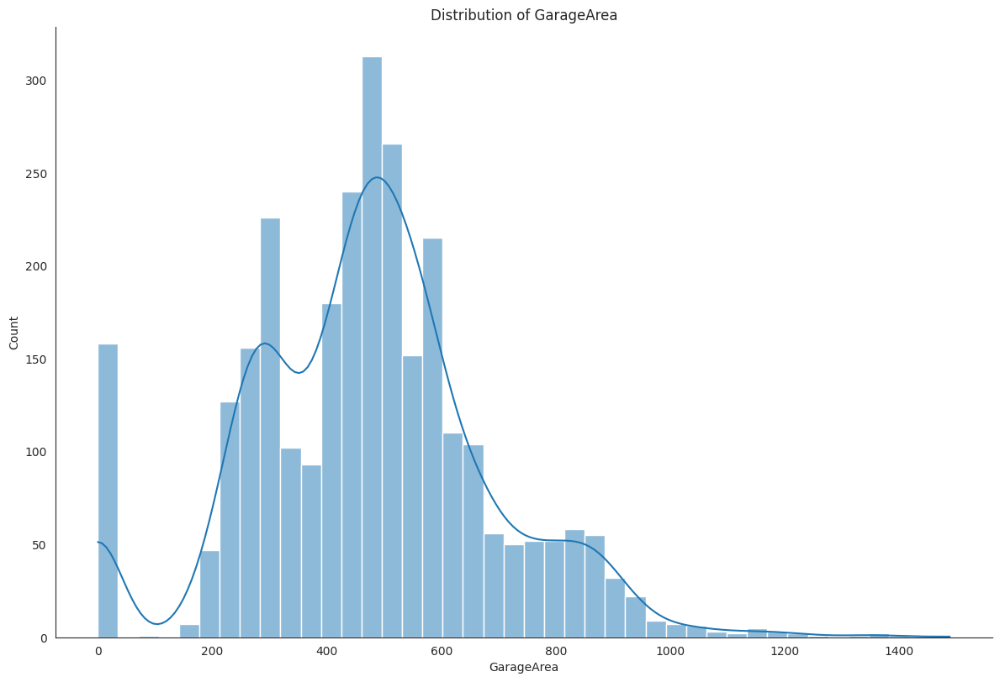

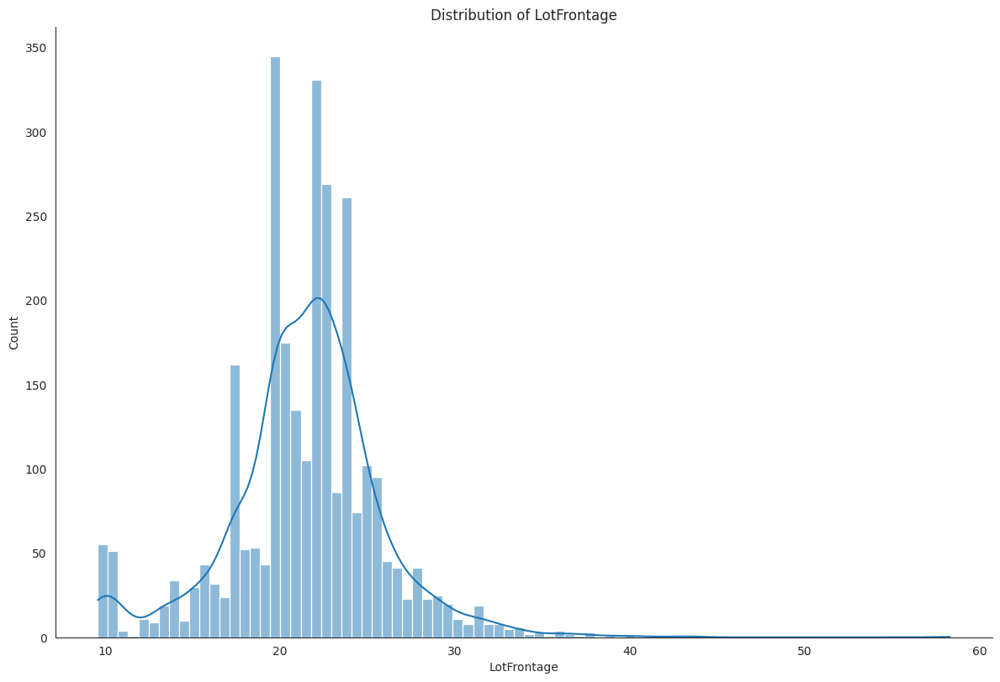

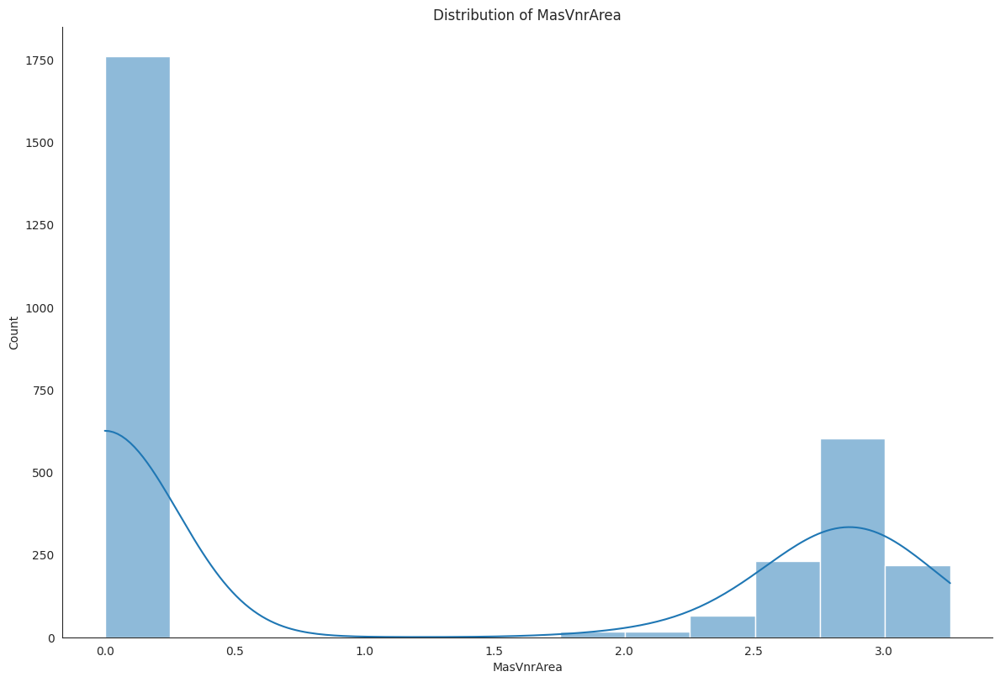

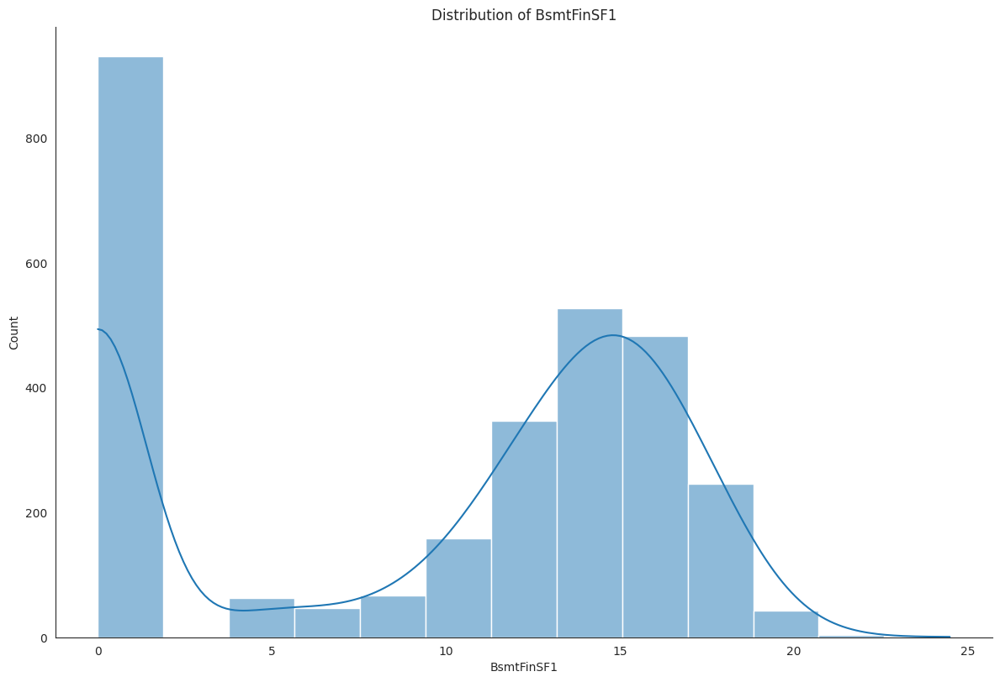

In [52]:
# Display the distribution and kernel density estimation for each column with larger figure size
for column in df.columns:
    sns.displot(df[column], kde=True, height=8, aspect=1.5)
    plt.title(f'Distribution of {column}')
    plt.show()

In [53]:
for elt in ['Utilities', 'Street', 'PoolQC',]:
    print(all_features[elt].unique())

['AllPub' 'NoSeWa' 'None']
['Pave' 'Grvl']
['None' 'Ex' 'Fa' 'Gd']


In [54]:
all_features['BsmtFinType1_Unf'] = 1*(all_features['BsmtFinType1'] == 'Unf')
all_features['HasWoodDeck'] = (all_features['WoodDeckSF'] == 0) * 1
all_features['HasOpenPorch'] = (all_features['OpenPorchSF'] == 0) * 1
all_features['HasEnclosedPorch'] = (all_features['EnclosedPorch'] == 0) * 1
all_features['Has3SsnPorch'] = (all_features['3SsnPorch'] == 0) * 1
all_features['HasScreenPorch'] = (all_features['ScreenPorch'] == 0) * 1
all_features['YearsSinceRemodel'] = all_features['YrSold'].astype(int) - all_features['YearRemodAdd'].astype(int)
all_features['Total_Home_Quality'] = all_features['OverallQual'] + all_features['OverallCond']
all_features = all_features.drop(['Utilities', 'Street', 'PoolQC',], axis=1)
all_features['TotalSF'] = all_features['TotalBsmtSF'] + all_features['1stFlrSF'] + all_features['2ndFlrSF']
all_features['YrBltAndRemod'] = all_features['YearBuilt'] + all_features['YearRemodAdd']

all_features['Total_sqr_footage'] = (all_features['BsmtFinSF1'] + all_features['BsmtFinSF2'] +
                                 all_features['1stFlrSF'] + all_features['2ndFlrSF'])
all_features['Total_Bathrooms'] = (all_features['FullBath'] + (0.5 * all_features['HalfBath']) +
                               all_features['BsmtFullBath'] + (0.5 * all_features['BsmtHalfBath']))
all_features['Total_porch_sf'] = (all_features['OpenPorchSF'] + all_features['3SsnPorch'] +
                              all_features['EnclosedPorch'] + all_features['ScreenPorch'] +
                              all_features['WoodDeckSF'])
all_features['TotalBsmtSF'] = all_features['TotalBsmtSF'].apply(lambda x: np.exp(6) if x <= 0.0 else x)
all_features['2ndFlrSF'] = all_features['2ndFlrSF'].apply(lambda x: np.exp(6.5) if x <= 0.0 else x)
all_features['GarageArea'] = all_features['GarageArea'].apply(lambda x: np.exp(6) if x <= 0.0 else x)
all_features['GarageCars'] = all_features['GarageCars'].apply(lambda x: 0 if x <= 0.0 else x)
all_features['LotFrontage'] = all_features['LotFrontage'].apply(lambda x: np.exp(4.2) if x <= 0.0 else x)
all_features['MasVnrArea'] = all_features['MasVnrArea'].apply(lambda x: np.exp(4) if x <= 0.0 else x)
all_features['BsmtFinSF1'] = all_features['BsmtFinSF1'].apply(lambda x: np.exp(6.5) if x <= 0.0 else x)

all_features['haspool'] = all_features['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
all_features['has2ndfloor'] = all_features['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
all_features['hasgarage'] = all_features['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
all_features['hasbsmt'] = all_features['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
all_features['hasfireplace'] = all_features['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

The process of feature engineering involves creating new data attributes or transforming existing ones to enhance the predictive power of machine learning models. By generating these engineered features, we can provide the models with more relevant and informative inputs, thereby improving their ability to capture complex patterns within the data and make accurate predictions.

In the priviouse code snippet, various features are being created based on specific conditions and transformations applied to the dataset. These features include indicators for the presence of certain characteristics like unfinished basement type, wood deck, open porch, enclosed porch, and more. Additionally, calculations for total square footage, total bathrooms, total porch area, years since remodeling, total home quality, and other composite features are being computed to enrich the dataset.

The rationale behind this feature engineering process is to extract meaningful information from the existing data that may not be explicitly captured by the original features. By incorporating these engineered features, we aim to improve the model's performance and its ability to generalize well to unseen data, ultimately enhancing the accuracy of predictions in the housing dataset scenario provided.

At this point, understanding the intricacies and nuances of your data is crucial before delving into the analysis process. By gaining a deep understanding of the dataset, including the features, their distributions, relationships, and potential insights they hold, you can make informed decisions throughout the analysis and modeling stages.

Here are some key reasons why understanding the depth of your data is essential:

1. **Data Quality**: Assessing the quality of your data, including missing values, outliers, and inconsistencies, is vital to ensure the reliability of your analysis results.

2. **Feature Understanding**: Understanding the meaning and significance of each feature in your dataset helps in selecting relevant features for analysis and modeling.

3. **Data Distribution**: Examining the distribution of data across different features provides insights into the underlying patterns and relationships within the dataset.

4. **Data Relationships**: Exploring relationships between features can uncover correlations, dependencies, and interactions that can impact the analysis and modeling outcomes.

5. **Feature Engineering**: Identifying opportunities for feature engineering, as demonstrated in the provided code snippet, allows you to create new features that capture important aspects of the data and improve model performance.

6. **Model Interpretation**: Understanding the data can aid in interpreting the results of machine learning models and making informed decisions based on the insights derived from the analysis.

By comprehensively understanding the depth of your data, you can effectively prepare and preprocess the dataset, select appropriate analysis techniques, and derive meaningful insights that drive informed decision-making and enhance the overall success of your data analysis project.

In [55]:
all_features

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,BsmtFinType1_Unf,HasWoodDeck,HasOpenPorch,HasEnclosedPorch,Has3SsnPorch,HasScreenPorch,YearsSinceRemodel,Total_Home_Quality,TotalSF,YrBltAndRemod,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,haspool,has2ndfloor,hasgarage,hasbsmt,hasfireplace
0,60,RL,20.767314,17.941175,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,3.011831,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.854908,Gd,TA,PConc,Gd,TA,No,GLQ,15.089890,Unf,-0.0,20.210472,252.287849,GasA,Ex,Y,SBrkr,6.092297,4.424197,-0.0,8.086352,0.427225,-0.00000,2,0.34646,3,0.427656,Gd,2.101584,Typ,-0.000000,None,Attchd,2003.0,RFn,2.0,548.000000,TA,TA,Y,-0.000000,4.307414,-0.000000,-0.0,-0.0,-0.0,None,None,-0.000000,2,2008,WD,Normal,0,1,0,1,1,1,5,10.011831,262.804343,4006,25.606384,2.600455,4.307414,0,1,1,1,0
1,20,RL,23.855714,18.387385,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,4.197446,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,54.598150,TA,TA,CBlock,Gd,TA,Gd,ALQ,16.581535,Unf,-0.0,27.943027,342.326360,GasA,Ex,Y,SBrkr,6.404851,665.141633,-0.0,7.730168,-0.000000,0.04214,2,-0.00000,3,0.427656,TA,1.870643,Typ,0.583552,TA,Attchd,1976.0,RFn,2.0,460.000000,TA,TA,Y,4.557433,0.000000,-0.000000,-0.0,-0.0,-0.0,None,None,-0.000000,5,2007,WD,Normal,0,0,1,1,1,1,31,10.197446,348.731211,3952,22.986385,2.021070,4.557433,0,1,1,1,1
2,60,RL,21.404124,18.953064,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,3.011831,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.806492,Gd,TA,PConc,Gd,TA,Mn,GLQ,13.511345,Unf,-0.0,34.522432,267.008817,GasA,Ex,Y,SBrkr,6.150628,4.429777,-0.0,8.137536,0.427225,-0.00000,2,0.34646,3,0.427656,Gd,1.870643,Typ,0.583552,TA,Attchd,2001.0,RFn,2.0,608.000000,TA,TA,Y,-0.000000,3.910547,-0.000000,-0.0,-0.0,-0.0,None,None,-0.000000,9,2008,WD,Normal,0,1,0,1,1,1,6,10.011831,277.589223,4003,24.091750,2.600455,3.910547,0,1,1,1,1
3,70,RL,19.681741,18.368969,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,3.011831,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,54.598150,TA,TA,BrkTil,TA,Gd,No,ALQ,10.513238,Unf,-0.0,38.459567,228.796842,GasA,Gd,Y,SBrkr,6.185840,4.375007,-0.0,8.091158,0.427225,-0.00000,1,-0.00000,3,0.427656,Gd,1.993644,Typ,0.583552,Gd,Detchd,1998.0,Unf,3.0,642.000000,TA,TA,Y,-0.000000,3.718922,0.769325,-0.0,-0.0,-0.0,None,None,-0.000000,2,2006,WD,Abnorml,0,1,0,0,1,1,36,10.011831,239.357689,3885,21.074085,1.427225,4.488247,0,1,1,1,1
4,60,RL,24.642609,19.822022,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,3.011831,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,2.988466,Gd,TA,PConc,Gd,TA,Av,GLQ,14.762062,Unf,-0.0,36.659088,317.125657,GasA,Ex,Y,SBrkr,6.326855,4.506874,-0.0,8.382542,0.427225,-0.00000,2,0.34646,4,0.427656,Gd,2.197701,Typ,0.583552,TA,Attchd,2000.0,RFn,3.0,836.000000,TA,TA,Y,4.277659,4.652008,-0.000000,-0.0,-0.0,-0.0,None,None,-0.000000,12,2008,WD,Normal,0,0,0,1,1,1,8,11.011831,327.959386,4000,25.595791,2.600455,8.929666,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [56]:
df = all_features[['TotalBsmtSF','2ndFlrSF', 'GarageCars', 'GarageArea', 'LotFrontage', 'MasVnrArea', 'BsmtFinSF1']]
df

,TotalBsmtSF,2ndFlrSF,GarageCars,GarageArea,LotFrontage,MasVnrArea,BsmtFinSF1
0,252.287849,4.424197,2.0,548.000000,20.767314,2.854908,15.089890
1,342.326360,665.141633,2.0,460.000000,23.855714,54.598150,16.581535
2,267.008817,4.429777,2.0,608.000000,21.404124,2.806492,13.511345
3,228.796842,4.375007,3.0,642.000000,19.681741,54.598150,10.513238
4,317.125657,4.506874,3.0,836.000000,24.642609,2.988466,14.762062
...,...,...,...,...,...,...,...
2912,177.084465,4.239679,0.0,403.428793,9.579061,54.598150,665.141633
2913,177.084465,4.239679,1.0,286.000000,9.579061,54.598150,11.041137
2914,334.199239,665.141633,2.0,576.000000,37.686069,54.598150,17.674602
2915,265.181108,665.141633,0.0,403.428793,20.119759,54.598150,12.088715


In [57]:
df.describe()

,TotalBsmtSF,2ndFlrSF,GarageCars,GarageArea,LotFrontage,MasVnrArea,BsmtFinSF1
count,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000,2917.000000
mean,301.973196,382.208288,1.765513,494.099331,21.457328,34.077436,221.518744
std,86.596229,327.020828,0.762102,183.896251,4.424521,25.332415,303.561992
min,48.026663,3.481743,0.000000,100.000000,9.579061,0.633644,1.247284
25%,242.966726,4.400952,1.000000,384.000000,19.681741,2.920711,13.384822
50%,288.906741,665.141633,2.000000,480.000000,21.823010,54.598150,15.925927
75%,360.947623,665.141633,2.000000,576.000000,23.855714,54.598150,665.141633
max,1023.799280,665.141633,5.000000,1488.000000,58.313541,54.598150,665.141633


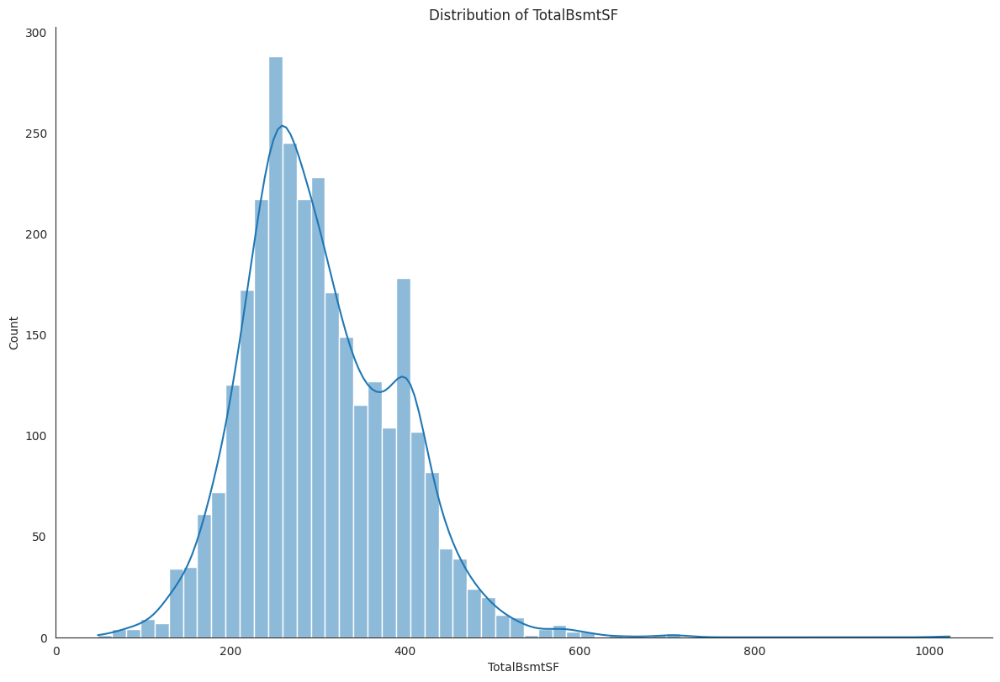

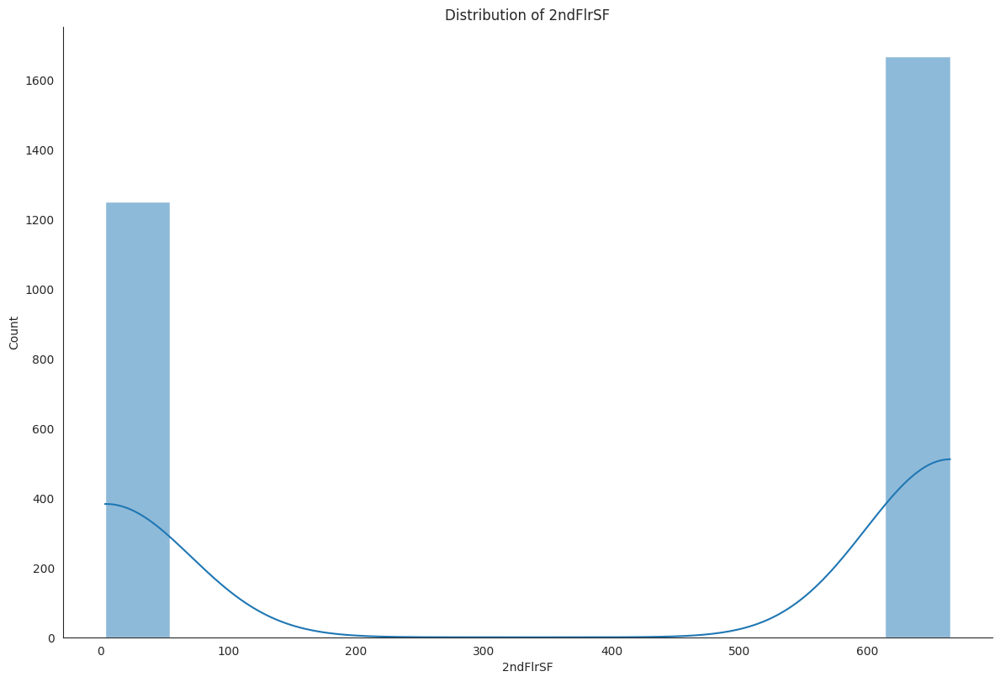

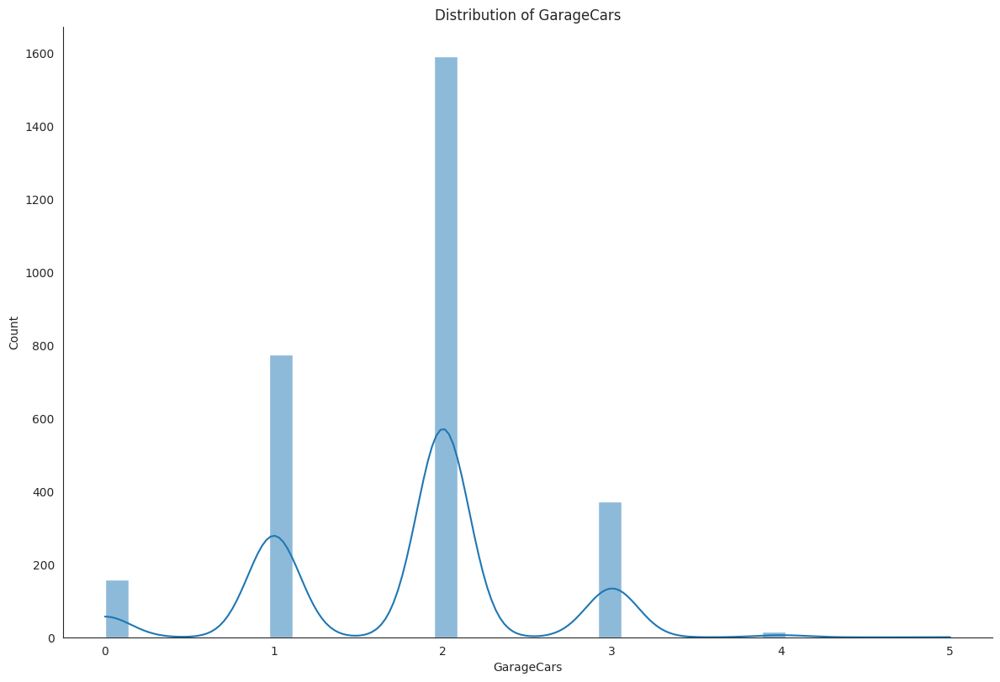

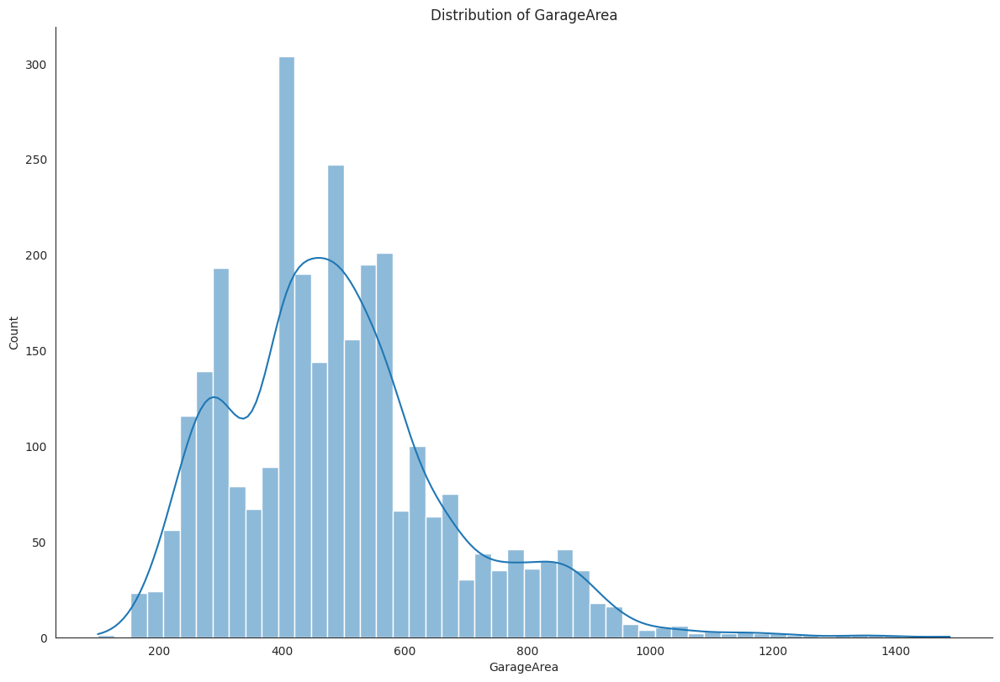

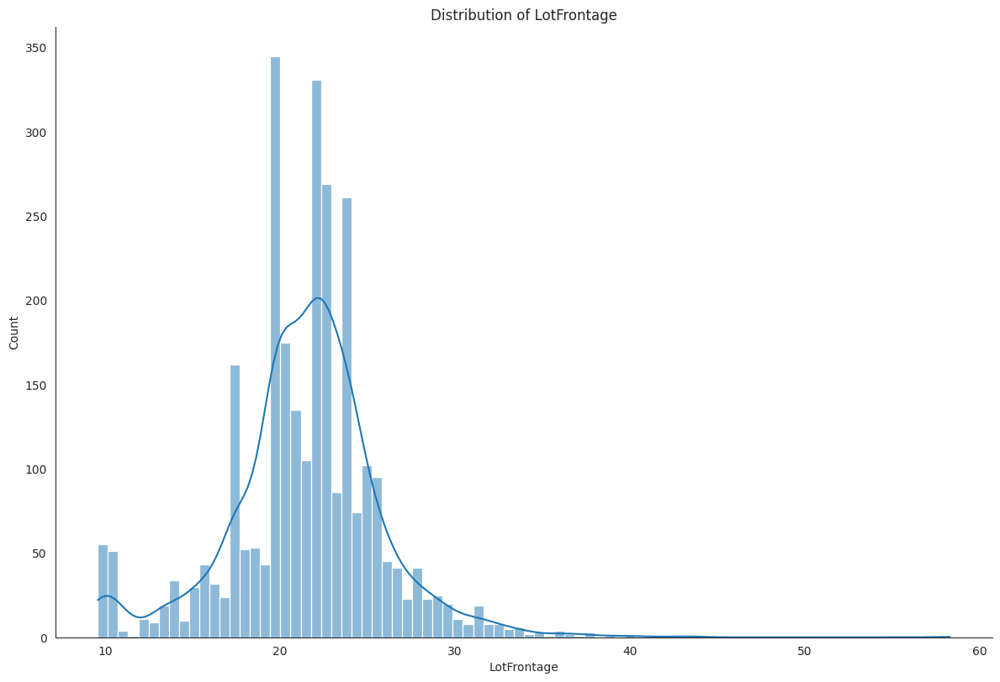

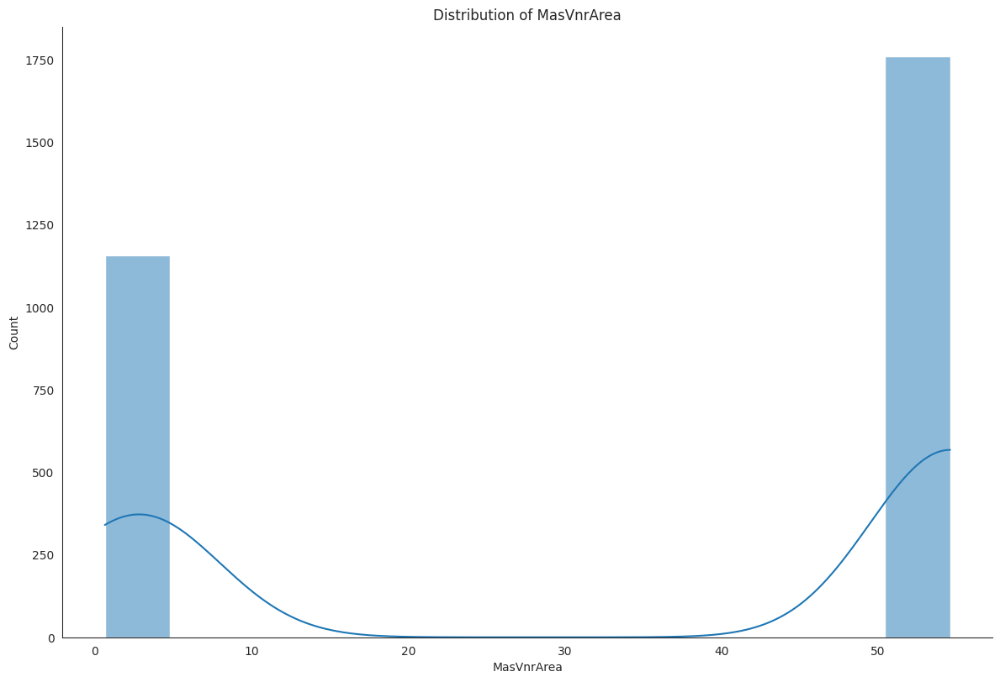

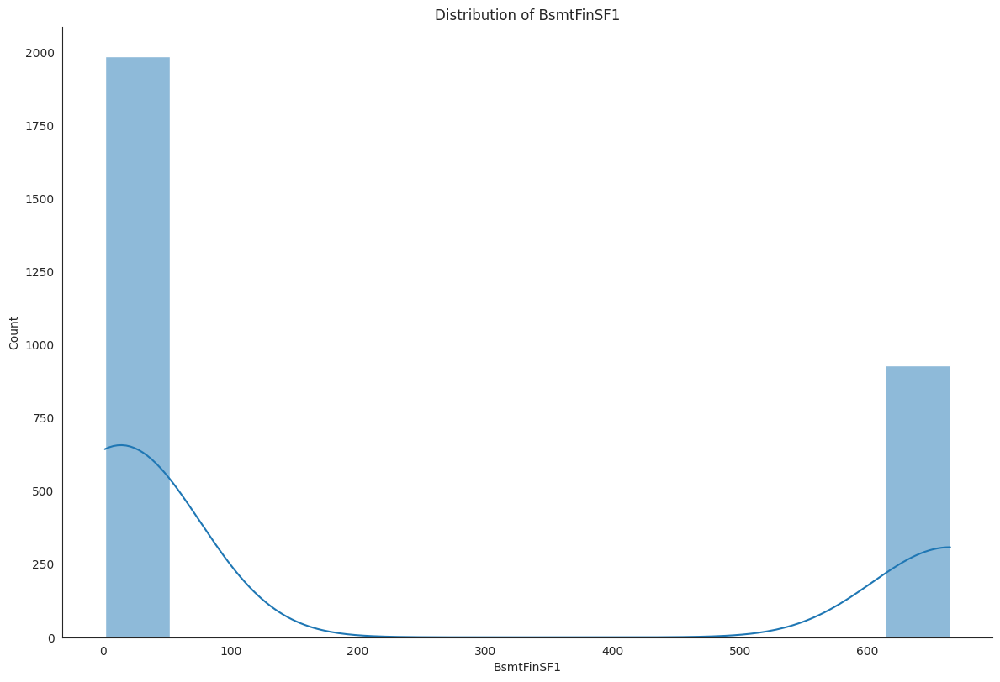

In [58]:
# Display the distribution and kernel density estimation for each column with larger figure size
for column in df.columns:
    sns.displot(df[column], kde=True, height=8, aspect=1.5)
    plt.title(f'Distribution of {column}')
    plt.show()

# 🌌Feature transformations

Let's create more features by calculating the log and square transformations of our numerical features. We do this manually, because ML models won't be able to reliably tell if log(feature) or feature^2 is a predictor of the SalePrice.

# 📢❗🚨
Logarithmic transformations (log) and square transformations (squares) are variable transformation techniques that can be applied to different types of variables based on their distributions and relationships with the target variable. Here are some general recommendations on the types of variables that are commonly subjected to logarithmic transformations and square transformations:

**Logarithmic Transformations (Log)**:
1. **Positively Skewed Variables**: Variables with a positively skewed distribution can benefit from a logarithmic transformation to reduce skewness and make the distribution more symmetric.
2. **Variables with Extreme Values**: Variables with extreme values can be log-transformed to mitigate the impact of outliers on models.
3. **Exponentially Growing Variables**: Variables with exponential growth, such as monetary amounts or sizes, can be log-transformed to linearize the relationship.

**Examples of Variables for Logarithmic Transformations**:
- TotalBsmtSF
- LotArea
- MasVnrArea
- GrLivArea
- GarageArea

**Square Transformations (Squares)**:
1. **Variables with Quadratic Relationships**: Variables exhibiting quadratic relationships with the target variable can benefit from a square transformation to capture these non-linear relationships.
2. **Interaction Variables**: Variables that interact with themselves or have non-linear effects can be squared to capture these interactions.
3. **Variables with Quadratic Effects**: Variables with a quadratic effect on the target variable can be squared to model this effect.

**Examples of Variables for Square Transformations**:
- YearRemodAdd
- TotalBsmtSF_log
- 1stFlrSF_log
- GrLivArea_log

It is important to note that the choice of transformations depends on the data nature, relationships between variables, and specific modeling objectives. It is recommended to test different transformations and evaluate their impact on model performance to determine the most suitable transformations for your dataset and analysis task.

In [59]:
def logs(res, ls):
    m = res.shape[1]
    for l in ls:
        res = res.assign(newcol=pd.Series(np.log(1.01+res[l])).values)   
        res.columns.values[m] = l + '_log'
        m += 1
    return res

log_features = ['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF',
                 'TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea',
                 'BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr',
                 'TotRmsAbvGrd','Fireplaces','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF',
                 'EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','YearRemodAdd','TotalSF']

all_features = logs(all_features, log_features)

1. **Function Explanation**:
   - The `logs` function takes two parameters: `res`, which is the input DataFrame containing the numerical features, and `ls`, which is a list of feature names to be log-transformed.
   - It iterates over each feature name in the `ls` list and applies a log transformation to the corresponding column in the DataFrame.
   - The log transformation is calculated as `np.log(1.01 + res[l])`, where 1.01 is added to avoid taking the log of zero or negative values.
   - The transformed feature is then added as a new column in the DataFrame, and the original column name is modified to indicate that it has been log-transformed.

2. **Importance**:
   - **Skewness Correction**: Log transformations are commonly used to reduce skewness in the distribution of numerical features. By taking the logarithm of the values, you can make the data more normally distributed, which can benefit many machine learning algorithms that assume normality.
   - **Non-linear Relationships**: Log transformations can help capture non-linear relationships between features and the target variable. They can emphasize differences in lower values and compress higher values, making patterns more discernible.
   - **Feature Engineering**: Feature engineering, including log transformations, is crucial for improving model performance and capturing complex patterns in the data. It allows you to extract more information from the existing features and enhance the predictive power of the model.
   - **Model Interpretability**: Log-transformed features can sometimes make the relationships between variables more interpretable and provide insights into the data that may not be evident in the original form.

By applying log transformations to the specified numerical features in the `all_features` DataFrame, you are enhancing the data's suitability for modeling, potentially improving model accuracy, and capturing non-linear relationships that may exist in the data. Feature transformations like log transformations are essential for preparing the data for machine learning tasks and extracting valuable information from the features.

In [60]:
def squares(res, ls):
    m = res.shape[1]
    for l in ls:
        res = res.assign(newcol=pd.Series(res[l]*res[l]).values)   
        res.columns.values[m] = l + '_sq'
        m += 1
    return res 

squared_features = ['YearRemodAdd', 'LotFrontage_log', 
              'TotalBsmtSF_log', '1stFlrSF_log', '2ndFlrSF_log', 'GrLivArea_log',
              'GarageCars_log', 'GarageArea_log']
all_features = squares(all_features, squared_features)

1. **Function Explanation**:
   - The `squares` function takes two parameters: `res`, which is the input DataFrame containing the features, and `ls`, which is a list of feature names to be squared.
   - It iterates over each feature name in the `ls` list and applies a square transformation by multiplying the feature by itself.
   - The squared feature is then added as a new column in the DataFrame, and the original column name is modified to indicate that it has been squared.

2. **Importance**:
   - **Capturing Non-linear Relationships**: Square transformations are used to capture non-linear relationships between features and the target variable. By squaring the values of a feature, you can highlight non-linear patterns and interactions that may exist in the data.
   - **Feature Interaction**: Squaring a feature allows you to capture interactions between the feature and itself, which can be important in modeling complex relationships in the data.
   - **Improving Model Performance**: Square transformations can help improve the performance of machine learning models by introducing non-linearities and capturing higher-order relationships in the data.
   - **Feature Engineering**: Feature engineering techniques like square transformations are essential for creating new features that enhance the predictive power of the model and provide valuable insights into the data.

By applying square transformations to the specified features in the `all_features` DataFrame, you are enhancing the data's suitability for modeling, capturing complex relationships, and potentially improving the model's accuracy and predictive performance. Feature transformations like square transformations play a crucial role in feature engineering, enabling you to extract more information from the data and improve the model's ability to capture non-linear patterns and interactions in the data.

# 📟Encode categorical features
___

Encoding categorical features into numerical representations is essential in machine learning for several reasons:

1. **Algorithm Compatibility**: Most machine learning algorithms require numerical input data. By encoding categorical features into numerical values, you make the data compatible with a wide range of machine learning algorithms.

2. **Feature Representation**: Converting categorical features to numerical values allows the algorithm to interpret and use the information effectively. It provides a meaningful representation of categorical variables in a format that algorithms can process.

3. **Relationships and Patterns**: Encoding categorical features can reveal relationships and patterns that may exist within the data. It allows the algorithm to identify correlations between categorical variables and the target variable.

4. **Model Performance**: Proper encoding of categorical features can lead to improved model performance. It helps the algorithm make better predictions by capturing the underlying patterns in the data.

5. **Handling Ordinal Data**: For ordinal categorical variables (categories with a natural ordering), encoding them numerically preserves the ordinal relationship, allowing the algorithm to understand the hierarchy of values.

6. **Avoiding Bias**: Incorrectly treating categorical variables as numerical can introduce bias and misleading interpretations in the model. Proper encoding ensures that the algorithm treats each category appropriately.

7. **Efficient Computation**: Numerical data is easier and faster to process computationally compared to categorical data. Encoding categorical features simplifies data processing and computation.

8. **Feature Engineering**: Encoding categorical features is a crucial step in feature engineering. It allows for the creation of new features and transformations based on categorical variables, enhancing the model's predictive power.

Overall, encoding categorical features into numerical representations is fundamental for enabling machine learning algorithms to effectively interpret, analyze, and make predictions based on categorical data. It ensures that the algorithm can leverage the information contained in categorical variables and produce accurate and meaningful results.

In [61]:
all_features = pd.get_dummies(all_features).reset_index(drop=True).astype(float)
print(all_features.shape)

(2917, 379)


In [62]:
all_features.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,BsmtFinType1_Unf,HasWoodDeck,HasOpenPorch,HasEnclosedPorch,Has3SsnPorch,HasScreenPorch,YearsSinceRemodel,Total_Home_Quality,TotalSF,YrBltAndRemod,Total_sqr_footage,Total_Bathrooms,Total_porch_sf,haspool,has2ndfloor,hasgarage,hasbsmt,hasfireplace,LotFrontage_log,LotArea_log,MasVnrArea_log,BsmtFinSF1_log,BsmtFinSF2_log,BsmtUnfSF_log,TotalBsmtSF_log,1stFlrSF_log,2ndFlrSF_log,LowQualFinSF_log,GrLivArea_log,BsmtFullBath_log,BsmtHalfBath_log,FullBath_log,HalfBath_log,BedroomAbvGr_log,KitchenAbvGr_log,TotRmsAbvGrd_log,Fireplaces_log,GarageCars_log,GarageArea_log,WoodDeckSF_log,OpenPorchSF_log,EnclosedPorch_log,3SsnPorch_log,ScreenPorch_log,PoolArea_log,MiscVal_log,YearRemodAdd_log,TotalSF_log,YearRemodAdd_sq,LotFrontage_log_sq,TotalBsmtSF_log_sq,1stFlrSF_log_sq,2ndFlrSF_log_sq,GrLivArea_log_sq,GarageCars_log_sq,GarageArea_log_sq,MSSubClass_120,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_Grvl,Alley_None,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po

In [63]:
# Remove any duplicated column names
all_features = all_features.loc[:,~all_features.columns.duplicated()]
all_features.shape

(2917, 378)

# ✂️Split : Recreate training and test sets

In [64]:
len(train_labels)

1458

In [65]:
X = all_features.iloc[:len(train_labels), :]
X_test = all_features.iloc[len(train_labels):, :]
X.shape, train_labels.shape, X_test.shape

((1458, 378), (1458,), (1459, 378))

Visualize some of the features we're going to train our models on.

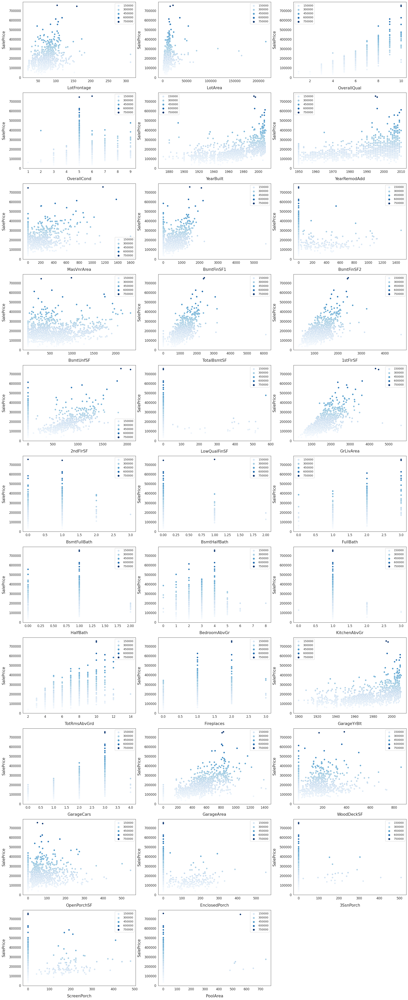

In [66]:
# Finding numeric features
numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric = []
for i in X.columns:
    if X[i].dtype in numeric_dtypes:
        if i in ['TotalSF', 'Total_Bathrooms', 'Total_porch_sf', 'haspool', 'hasgarage', 'hasbsmt', 'hasfireplace']:
            pass
        else:
            numeric.append(i)     

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(7, 300))
plt.subplots_adjust(right=3)
plt.subplots_adjust(top=6) 
sns.color_palette("husl", 8)

for i, feature in enumerate(list(X[numeric]), 1):
    if feature == 'MiscVal':
        break
    plt.subplot(len(list(numeric)), 3, i)
    sns.scatterplot(x=feature, y='SalePrice', hue='SalePrice', palette='Blues', data=train)
        
    plt.xlabel('{}'.format(feature), size=15, labelpad=12.5)
    plt.ylabel('SalePrice', size=15, labelpad=12.5)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(loc='best', prop={'size': 10})
        
plt.show()


# 🏋️‍♂️Model
___

**> Key components of the model training process include:**

1. **Cross-Validation**:
   - Utilizing a 12-fold cross-validation technique to assess the model's performance. Cross-validation helps evaluate the model's generalization ability by splitting the data into multiple subsets for training and testing.

2. **Models**:
   - Training 7 different models during each iteration of cross-validation, including ridge regression, support vector regression (SVR), gradient boosting, random forest, XGBoost, and LightGBM regressors. Each model brings unique strengths and characteristics to the prediction task.

3. **Stacking**:
   - Implementing a meta StackingCVRegressor that combines the predictions of the base models using XGBoost optimization. Stacking involves training a meta-model that learns how to best combine the predictions of the base models to improve overall performance.

4. **Blending**:
   - Recognizing that individual models may overfit the training data to varying degrees, blending is applied to aggregate the predictions of all models. By blending the predictions, a more robust and stable prediction is achieved, reducing the risk of overfitting and enhancing the model's predictive accuracy.

### ✔️Setup cross validation and define error metrics

In [67]:
# Setup cross validation folds
kf = KFold(n_splits=12, random_state=42, shuffle=True)

# Define error metrics
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X):
    rmse = np.sqrt(-cross_val_score(model, X, train_labels, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

# ⚒Setup models

# Detailed Explanation of Models with Mathematical Formulas

1. **Light Gradient Boosting Regressor (LightGBM)**:

- **Functioning**: LightGBM is a gradient boosting framework that uses a tree-based learning algorithm. It grows trees vertically, leaf-wise, and optimizes the loss function using a gradient descent method.

- **Mathematical Formula**: The prediction for a sample $x_i$ can be represented as: $$\hat{y}_i = \sum_{k=1}^{K} f_k(x_i)$$
where $f_k$ represents the $k$th tree in the ensemble.

2. **XGBoost Regressor**:

- **Functioning**: XGBoost is an optimized gradient boosting library that uses a decision tree ensemble to make predictions. It sequentially builds trees to correct errors made by previous trees.

- **Mathematical Formula**: The prediction for a sample $x_i$ can be written as:  $$\hat{y}_i = \sum_{k=1}^{K} f_k(x_i)$$
where $f_k$ is the prediction of the $k$th tree.

3. **Ridge Regressor**:

- **Functioning**: Ridge regression is a linear regression model with L2 regularization, which penalizes large coefficients to prevent overfitting.

- **Mathematical Formula**: The objective function to minimize is:  $$\text{minimize} \left( ||Xw - y||^2_2 + \alpha ||w||^2_2 \right)$$

4. **Support Vector Regressor (SVR)**:

- **Functioning**: SVR is a support vector machine algorithm for regression tasks that finds a hyperplane with a maximum margin from the data points.

- **Mathematical Formula**: The optimization problem is formulated as:  $$\min_{w,b,\zeta,\zeta^*} \frac{1}{2} w^T w + C \sum_{i=1}^{n} (\zeta_i + \zeta_i^*)$$

5. **Gradient Boosting Regressor**:

- **Functioning**: Gradient boosting builds an ensemble of decision trees in a stage-wise manner to minimize the loss function.

- **Mathematical Formula**: The prediction for a sample $x_i$ is given by:  $$\hat{y}_i = \sum_{k=1}^{K} \gamma_k h_k(x_i)$$

6. **Random Forest Regressor**:

- **Functioning**: Random Forest is an ensemble learning method that builds multiple decision trees and aggregates their predictions for regression tasks.

- **Mathematical Formula**: The prediction is the average of predictions from individual trees:  $$\hat{y}_i = \frac{1}{N} \sum_{k=1}^{N} h_k(x_i)$$

7. **StackingCV Regressor**:

- **Functioning**: StackingCVRegressor combines predictions from base models using a meta-regressor to improve predictive performance through model blending.

- **Mathematical Formula**: The prediction is a weighted sum of predictions from base models:  $$\hat{y}_i = \sum_{k=1}^{K} w_k \hat{y}_{k,i}$$

These mathematical formulations provide insights into how each model makes predictions and optimizes the loss function during the training process.

Learn more about all these here : https://medium.com/@codekalimi/list-of-machine-learning-models-61b51ad492f1

In [68]:
# Light Gradient Boosting Regressor
lightgbm = LGBMRegressor(objective='regression', 
                       num_leaves=31,
                       learning_rate=0.01, 
                       n_estimators=7000,
                       max_bin=200, 
                       bagging_fraction=0.8,
                       bagging_freq=4, 
                       bagging_seed=8,
                       feature_fraction=0.2,
                       feature_fraction_seed=8,
                       min_sum_hessian_in_leaf = 11,
                       verbose=-1,
                       random_state=42)

# XGBoost Regressor
xgboost = XGBRegressor(learning_rate=0.01,
                       n_estimators=6000,
                       max_depth=4,
                       min_child_weight=0,
                       gamma=0.6,
                       subsample=0.7,
                       colsample_bytree=0.7,
                       objective='reg:linear',
                       nthread=-1,
                       scale_pos_weight=1,
                       seed=27,
                       reg_alpha=0.00006,
                       random_state=42)

# Ridge Regressor
ridge_alphas = [1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100]
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=ridge_alphas, cv=kf))

# Support Vector Regressor
svr = make_pipeline(RobustScaler(), SVR(C= 20, epsilon= 0.008, gamma=0.0003))

# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=6000,
                                learning_rate=0.01,
                                max_depth=4,
                                max_features='sqrt',
                                min_samples_leaf=15,
                                min_samples_split=10,
                                loss='huber',
                                random_state=42)  

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

# Stack up all the models above, optimized using xgboost
stack_gen = StackingCVRegressor(regressors=(xgboost, lightgbm, svr, ridge, gbr, rf),
                                meta_regressor=xgboost,
                                use_features_in_secondary=True)

You can play with the parameters to have something more better.

# 💪Traning mode
___

Get cross validation scores for each model

In [69]:
scores = {}

score = cv_rmse(lightgbm)
print("lightgbm: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['lgb'] = (score.mean(), score.std())

score = cv_rmse(xgboost)
print("xgboost: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['xgb'] = (score.mean(), score.std())

score = cv_rmse(svr)
print("SVR: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['svr'] = (score.mean(), score.std())

score = cv_rmse(ridge)
print("ridge: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['ridge'] = (score.mean(), score.std())

score = cv_rmse(rf)
print("rf: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['rf'] = (score.mean(), score.std())

score = cv_rmse(gbr)
print("gbr: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['gbr'] = (score.mean(), score.std())

lightgbm: 0.1193 (0.0165)
xgboost: 0.1345 (0.0169)
SVR: 0.1079 (0.0184)
ridge: 0.1110 (0.0163)
rf: 0.1370 (0.0185)
gbr: 0.1129 (0.0162)


In [70]:
scores

{'lgb': (0.11926396064857668, 0.01646153776032301),
 'xgb': (0.13449347874173873, 0.016903721409341856),
 'svr': (0.10791691966715013, 0.018368275878646402),
 'ridge': (0.11096730867726522, 0.01627612458355182),
 'rf': (0.13701576763889256, 0.018498400808699026),
 'gbr': (0.11285120943938044, 0.01619438081758788)}

# 🏃Fit the models

In [71]:
stack_gen_model = stack_gen.fit(np.array(X), np.array(train_labels))

lgb_model_full_data = lightgbm.fit(X, train_labels)

xgb_model_full_data = xgboost.fit(X, train_labels)

svr_model_full_data = svr.fit(X, train_labels)

ridge_model_full_data = ridge.fit(X, train_labels)

rf_model_full_data = rf.fit(X, train_labels)

gbr_model_full_data = gbr.fit(X, train_labels)

# 🔮Blend models and get predictions

In [72]:
# Blend models in order to make the final predictions more robust to overfitting
def blended_predictions(X):
    return ((0.1 * ridge_model_full_data.predict(X)) + \
            (0.2 * svr_model_full_data.predict(X)) + \
            (0.1 * gbr_model_full_data.predict(X)) + \
            (0.1 * xgb_model_full_data.predict(X)) + \
            (0.1 * lgb_model_full_data.predict(X)) + \
            (0.05 * rf_model_full_data.predict(X)) + \
            (0.35 * stack_gen_model.predict(np.array(X))))

In [73]:
# Get final precitions from the blended model
blended_score = rmsle(train_labels, blended_predictions(X))
scores['blended'] = (blended_score, 0)
print('RMSLE score on train data:')
print(blended_score)

RMSLE score on train data:
0.07344076703535174


# 🚥Identify the best performing model

In [74]:
scores.values()

dict_values([(0.11926396064857668, 0.01646153776032301), (0.13449347874173873, 0.016903721409341856), (0.10791691966715013, 0.018368275878646402), (0.11096730867726522, 0.01627612458355182), (0.13701576763889256, 0.018498400808699026), (0.11285120943938044, 0.01619438081758788), (0.07344076703535174, 0)])

In [75]:
for i, score in enumerate(scores.values()):
    print(i, score)

0 (0.11926396064857668, 0.01646153776032301)
1 (0.13449347874173873, 0.016903721409341856)
2 (0.10791691966715013, 0.018368275878646402)
3 (0.11096730867726522, 0.01627612458355182)
4 (0.13701576763889256, 0.018498400808699026)
5 (0.11285120943938044, 0.01619438081758788)
6 (0.07344076703535174, 0)


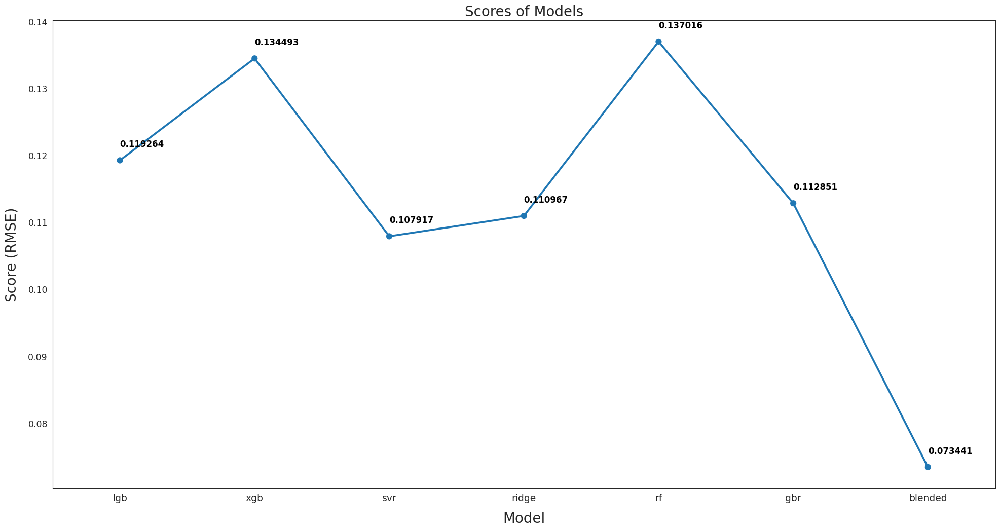

In [76]:
# Plot the predictions for each model
sns.set_style("white")
fig = plt.figure(figsize=(24, 12))

ax = sns.pointplot(x=list(scores.keys()), y=[score for score, _ in scores.values()], markers=['o'], linestyles=['-'])
for i, score in enumerate(scores.values()):
    ax.text(i, score[0] + 0.002, '{:.6f}'.format(score[0]), horizontalalignment='left', size='large', color='black', weight='semibold')

plt.ylabel('Score (RMSE)', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('Scores of Models', size=20)

plt.show()

We can observe from the graph above that the blended model far outperforms the other models, with an RMSLE of 0.075. This is the model we'll use for making the final predictions.

# 📭Submit predictions

In [77]:
# Read in sample_submission dataframe
submission = pd.read_csv("../input/house-prices-advanced-regression-techniques/sample_submission.csv")
submission.shape

(1459, 2)

In [78]:
submission.head()

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977


In [79]:
# Append predictions from blended models
submission.iloc[:,1] = np.floor(np.expm1(blended_predictions(X_test)))
submission.shape

(1459, 2)

In [80]:
# Fix outleir predictions
q1 = submission['SalePrice'].quantile(0.0045)
q2 = submission['SalePrice'].quantile(0.99)
submission['SalePrice'] = submission['SalePrice'].apply(lambda x: x if x > q1 else x*0.77)
submission['SalePrice'] = submission['SalePrice'].apply(lambda x: x if x < q2 else x*1.1)
submission.to_csv("submission_regression1.csv", index=False)

The values 0.77 and 1.1 are used in the code to adjust the house price predictions based on the calculated quantiles (q1 and q2) to correct for outliers. Here is a possible explanation for using these coefficients:

1. **0.77**:
   - When a prediction is below the 0.45th quantile (q1), it is adjusted by multiplying it by 0.77. This value, less than 1, reduces the existing prediction, which can be useful to mitigate the impact of values that are too low and potentially outliers. By multiplying by 0.77, the prediction is reduced by 23% from its initial value.

2. **1.1**:
   - When a prediction is above the 99th quantile (q2), it is adjusted by multiplying it by 1.1. This value slightly above 1 increases the existing prediction, which can be useful to correct values that are too high and potentially outliers. By multiplying by 1.1, the prediction is increased by 10% from its initial value.

These coefficients were chosen empirically to adjust the predicted values and bring them back to a more realistic range based on the calculated quantiles. They were selected to balance the correction of outliers while maintaining the relevance of the predictions. These values can be adjusted based on the specific characteristics of the problem and the data to achieve the best results in terms of model performance.

In [81]:
# Scale predictions
submission['SalePrice'] *= 1.001619
submission.to_csv("submission_regression2.csv", index=False)

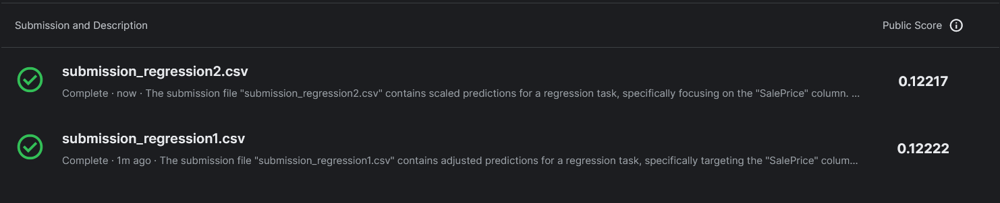

That's a thoughtful message to express gratitude towards those who took the time to read your notebook and offer suggestions for improvement. It's great to acknowledge the contributions of others and seek feedback to enhance your learning experience. Learning from others and their insights can indeed help you grow and improve your skills. If Lavanya Shukla's notebook was particularly helpful to you, expressing your appreciation can be a nice gesture. Keep up the positive attitude towards learning and seeking continuous improvement in your work!